In [1]:
%load_ext autoreload
%autoreload 2
import itertools
import math
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import rdMolTransforms
import py_rdl
import RA

Amino Acid List

["H","K","D","E","G","C","S","T","A","V","F","W","L","Y"]

In [153]:
alanine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH3X4])[CX3](=[OX1])[OX2H,OX1-,N]")
phenylalanine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][cX3]1[cX3H][cX3H][cX3H][cX3H][cX3H]1)[CX3](=[OX1])[OX2H,OX1-,N]")
tyrosin = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][cX3]1[cX3H][cX3H][cX3]([OHX2,OH0X1-])[cX3H][cX3H]1)[CX3](=[OX1])[OX2H,OX1-,N]")
tryptophan = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][cX3]1[cX3H][nX3H][cX3]2[cX3H][cX3H][cX3H][cX3H][cX3]12)[CX3](=[OX1])[OX2H,OX1-,N]")
leucine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][CHX4]([CH3X4])[CH3X4])[CX3](=[OX1])[OX2H,OX1-,N]")
valine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CHX4]([CH3X4])[CH3X4])[CX3](=[OX1])[OX2H,OX1-,N]") 
cysteine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][SX2H,SX1H0-])[CX3](=[OX1])[OX2H,OX1-,N]")
glycine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([$([$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H2][CX3](=[OX1])[OX2H,OX1-,N])])[CX3](=[OX1])[OX2H,OX1-,N]")
histidine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][#6X3]1:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]1)[CX3](=[OX1])[OX2H,OX1-,N]")
lysine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][CH2X4][CH2X4][CH2X4][NX4+,NX3+0])[CX3](=[OX1])[OX2H,OX1-,N]")
aspartic_acid = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][CX3](=[OX1])[OH0-,OH])[CX3](=[OX1])[OX2H,OX1-,N]")
glutamic_acid = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][CH2X4][CX3](=[OX1])[OH0-,OH])[CX3](=[OX1])[OX2H,OX1-,N]")
serine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CH2X4][OX2H])[CX3](=[OX1])[OX2H,OX1-,N]")
threonine = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([CHX4]([CH3X4])[OX2H])[CX3](=[OX1])[OX2H,OX1-,N]")

In [7]:
# Side Chain SMARTS pattern
alanine = Chem.MolFromSmarts("[C;R](N)[CH3X4]")
aspartate = Chem.MolFromSmarts("[C;R](N)[CH2X4][CX3](=[OX1])[OH0-,OH]")
cysteine = Chem.MolFromSmarts("[C;R](N)[CH2X4][SX2H,SX1H0-]")
glutamate = Chem.MolFromSmarts("[C;R](N)[CH2X4][CH2X4][CX3](=[OX1])[OH0-,OH]")
glycine = Chem.MolFromSmarts("[C;R](N)[$([$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H2][CX3](=[OX1])[OX2H,OX1-,N])]")
histidine = Chem.MolFromSmarts("[C;R](N)[CH2X4][#6X3]1:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]1")
leucine = Chem.MolFromSmarts("[C;R](N)[CH2X4][CHX4]([CH3X4])[CH3X4]")
lysine = Chem.MolFromSmarts("[C;R](N)[CH2X4][CH2X4][CH2X4][CH2X4][NX4+,NX3+0]")
phenylalanine = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][cX3H][cX3H][cX3H][cX3H]1")
serine = Chem.MolFromSmarts("[C;R](N)[CH2X4][OX2H]")
threonine = Chem.MolFromSmarts("[C;R](N)[CHX4]([CH3X4])[OX2H]")
tryptophan = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][nX3H][cX3]2[cX3H][cX3H][cX3H][cX3H][cX3]12")
tyrosine = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][cX3H][cX3]([OHX2,OH0X1-])[cX3H][cX3H]1")
valine = Chem.MolFromSmarts("[C;R](N)[CHX4]([CH3X4])[CH3X4]")
sidechain = [alanine, valine, leucine, phenylalanine,tryptophan, tyrosine, serine, threonine,
             aspartate, glutamate, histidine, lysine, cysteine, glycine]

In [3]:
#ctps = Chem.SDMolSupplier("data/peptide_full.sdf",removeHs=False)
ctps = Chem.SDMolSupplier("../peptide/peptide_full.sdf",removeHs=False)

In [4]:
ctps_backbone = Chem.MolFromSmarts("C1(=O)CNC(=O)CNC(=O)CNC(=O)CN1")
backbone = Chem.MolFromSmarts("C1(=O)CN([#1])C(=O)CN([#1])C(=O)CN([#1])C(=O)CN([#1])1")

In [3]:
data = pd.read_csv("data/cyclic_peptide_2.csv")

In [8]:
volume = {"G":60.1,"A":88.6,"S":89.0,"C":108.5,"D":111.1,
         "P":112.7,"N":114.1,"T":116.1,"E":138.4,"V":140.0,
         "Q":143.8,"H":153.2,"M":162.9,"I":166.7,"L":166.7,
         "K":168.6,"R":173.4,"F":189.9,"Y":193.6,"W":227.8}


In [42]:
tmp = data[["P1","P2","P3","P4"]]
ccccidx = []
ccctidx = []
ttttidx = []
for idx, item in enumerate(tmp.values):
    if item.tolist() in [["C","C","C","C"]]:
        ccccidx.append(idx)
    elif item.tolist() in [["C","C","C","T"],["C","T","C","C"],["C","C","T","C"], ["T","C","C","C"]]:
        ccctidx.append(idx)
    elif item.tolist() in [["T","T","T","T"]]:
        ttttidx.append(idx)
w1 = data.iloc[ccccidx][["AA1","AA2","AA3","AA4"]]
w2 = data.iloc[ccctidx][["AA1","AA2","AA3","AA4"]]
w3 = data.iloc[ttttidx][["AA1","AA2","AA3","AA4"]]

In [43]:
e1 = []
for item in w1.values:
    qm = []
    for x in item.tolist():
        qm.append(volume.get(x))
    e1.append(qm)
    
e2 = []
for item in w2.values:
    qm = []
    for x in item.tolist():
        qm.append(volume.get(x))
    e2.append(qm)
    
e3 = []
for item in w3.values:
    qm = []
    for x in item.tolist():
        qm.append(volume.get(x))
    e3.append(qm)

In [45]:
s1 = np.array(e1).sum(axis=1)
s2 = np.array(e2).sum(axis=1)
s3 = np.array(e3).sum(axis=1)

In [67]:
one = w2["AA1"][data.iloc[ccctidx,:]["P1"]=="T"].values
two = w2["AA2"][data.iloc[ccctidx,:]["P2"]=="T"].values
three = w2["AA3"][data.iloc[ccctidx,:]["P3"]=="T"].values
four = w2["AA4"][data.iloc[ccctidx,:]["P4"]=="T"].values

In [75]:
np.unique(np.concatenate([one,two,three,four]),return_counts=True)

(array(['A', 'C', 'D', 'E', 'F', 'G', 'H', 'K', 'L', 'S', 'T', 'V', 'W',
        'Y'], dtype=object),
 array([267, 278, 259, 238, 267, 213, 237, 277, 309, 256, 285, 311, 317,
        272]))

In [55]:
np.unique(w1.values.reshape(-1),return_counts=True)

(array(['A', 'C', 'D', 'E', 'F', 'G', 'H', 'K', 'L', 'S', 'T', 'V', 'W',
        'Y'], dtype=object),
 array([1070,  802,  848, 1164,  965, 1264, 1095, 1013,  972, 1015, 1051,
         942,  889,  898]))

In [196]:
torsions = [[4,3,5,6], [9,8,10,11], [14,13,15,16], [19,18,0,1]]
cistrans = []
peptide_torsion = []
for idx, mol in enumerate(ctps):
    matches = mol.GetSubstructMatches(backbone)[0]
    torsion = []
    for item in torsions:
        torsion.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(),*[matches[x] for x in item]))
    peptide_torsion.append(torsion)
    tmp = []
    for t in torsion:
        if np.abs(t)<0.5:
            tmp.append("C")
        elif np.abs(np.abs(t)-np.pi)<0.5:
            tmp.append("T")
        else:
            tmp.append("NA")
    cistrans.append(tmp)

In [202]:
cp = []
orientation = []
aatype = []
for idx, mol in enumerate(ctps):
    matches = mol.GetSubstructMatches(ctps_backbone)
    ringloop = RA.CTPOrder(mol, [matches[0][x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]])
    coord = np.array([mol.GetConformer().GetAtomPosition(x) for x in ringloop])
    c_coord = RA.Translate(coord)
    cp.append(RA.GetRingPuckerCoords(c_coord))
    orientation.append([RA.GetRingSubstituentPosition(mol, ringloop, item) for item in [(0,1),(4,5),(8,9),(12,13)]])
    aatype.append([RA.GetAminoAcidType(mol,ringloop[i]) for i in [1,4,7,10]])

In [274]:
sidechain_orientation = []
sidechain = []
for mol in ctps:
    match = mol.GetSubstructMatches(ctps_backbone)[0]
    ringloop = RA.CTPOrder(mol, [match[x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]])
    idxs = [1,4,7,10] 
    aminoacids = [RA.GetAminoAcidType(mol,ringloop[x]) for x in idxs]
    sidechain.append(aminoacids)
    sidechain_firstatom = [RA.GetSideChainFirstAtoms(mol, ringloop[x], aminoacids[i]) for i,x in enumerate([1,4,7,10])]

    for i,j in enumerate(sidechain_firstatom):
        if j=="NA":
            sidechain_orientation.append((np.nan,np.nan))
        else:
            sidechain_orientation.append(RA.GetRingSubstituentPosition(mol, ringloop, (ringloop[idxs[i]],j)))

In [5]:
torsion = []
phi_psi = []
four_atom = [[11,0,1,2],[0,1,2,3],[2,3,4,5],[3,4,5,6],[5,6,7,8],[6,7,8,9],[8,9,10,11],[9,10,11,0]]
for idx, mol in enumerate(ctps):
    match = mol.GetSubstructMatches(ctps_backbone)[0]
    ringloop = RA.CTPOrder(mol,[match[x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]])
    torsion.append([rdMolTransforms.GetDihedralDeg(mol.GetConformer(),*[ringloop[x] for x in item]) for item in four_atom])
    

In [10]:
a = pd.DataFrame(np.array(torsion).reshape(8661*4,2))

([<matplotlib.axis.YTick at 0x7fe662847390>,
 <a list of 5 Text yticklabel objects>)

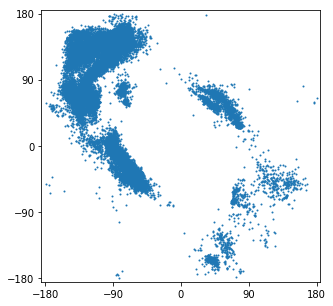

In [40]:
plt.figure(figsize=(5,5))
plt.scatter(a.iloc[:,1],a.iloc[:,0],s=1)
plt.xlim(-185,185)
plt.xticks([-180,-90,0,90,180])
plt.ylim(-185,185)
plt.yticks([-180,-90,0,90,180])

In [18]:
d = pd.read_csv("data/chi1.csv")

In [42]:
pd.DataFrame(a.values.reshape(8661,8)).to_csv("phi-psi.csv",index=None)

In [30]:
a.values

array([[ 133.2366381 , -102.05737404],
       [ 128.21547086, -123.99358065],
       [  65.94641974, -132.61203973],
       ...,
       [ -69.39553677,  122.40557226],
       [   7.0862883 , -121.60144716],
       [ 117.62108093,  -80.16189268]])

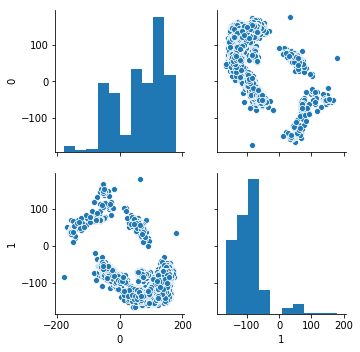

In [84]:
sns.pairplot(pd.DataFrame(np.array(torsion).reshape(8661,8)).iloc[:,:2])

In [278]:
alpha = np.array([item[0] for item in sidechain_orientation]).reshape(8661,4)
beta = np.array([item[1] for item in sidechain_orientation]).reshape(8661,4)

In [287]:
alphas = pd.DataFrame(alpha)
betas = pd.DataFrame(beta)

In [6]:
alanine = Chem.MolFromSmarts("[C;R](N)[CH3X4]")
aspartate = Chem.MolFromSmarts("[C;R](N)[CH2X4][CX3](=[OX1])[OH0-,OH]")
cysteine = Chem.MolFromSmarts("[C;R](N)[CH2X4][SX2H,SX1H0-]")
glutamate = Chem.MolFromSmarts("[C;R](N)[CH2X4][CH2X4][CX3](=[OX1])[OH0-,OH]")
glycine = Chem.MolFromSmarts("[C;R](N)[$([$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H2][CX3](=[OX1])[OX2H,OX1-,N])]")
histidine = Chem.MolFromSmarts("[C;R](N)[CH2X4][#6X3]1:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]1")
leucine = Chem.MolFromSmarts("[C;R](N)[CH2X4][CHX4]([CH3X4])[CH3X4]")
lysine = Chem.MolFromSmarts("[C;R](N)[CH2X4][CH2X4][CH2X4][CH2X4][NX4+,NX3+0]")
phenylalanine = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][cX3H][cX3H][cX3H][cX3H]1")
serine = Chem.MolFromSmarts("[C;R](N)[CH2X4][OX2H]")
threonine = Chem.MolFromSmarts("[C;R](N)[CHX4]([CH3X4])[OX2H]")
tryptophan = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][nX3H][cX3]2[cX3H][cX3H][cX3H][cX3H][cX3]12")
tyrosine = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][cX3H][cX3]([OHX2,OH0X1-])[cX3H][cX3H]1")
valine = Chem.MolFromSmarts("[C;R](N)[CHX4]([CH3X4])[CH3X4]")
aminoacid_list = ["W","Y","F","K","L","H","V","E","T","D","C","S","A","G"]
smarts = [tryptophan,tyrosine,phenylalanine,lysine,leucine,histidine,valine,glutamate,threonine,aspartate,cysteine,serine,alanine,glycine]
aminoacid_dict = dict(list(zip(aminoacid_list,smarts)))

In [9]:
chi1 = []
for mol in ctps:
    match = mol.GetSubstructMatches(ctps_backbone)[0]
    ringloop = RA.CTPOrder(mol,[match[x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]])
    aa = [RA.GetAminoAcidType(mol, ringloop[x]) for x in [1,4,7,10]]
    l = [1,4,7,10]
    for i,item in enumerate(aa):
        if item=="A" or item=="G":
            chi1.append(np.nan)
        else:
            pattern = aminoacid_dict.get(item)
            sub = mol.GetSubstructMatches(pattern)
            for s in sub:
                if s[0]==ringloop[l[i]]:
                    chi1.append(rdMolTransforms.GetDihedralDeg(mol.GetConformer(),s[1],s[0],s[2],s[3] ))
    

In [15]:
chi1frame = pd.DataFrame(np.array(chi1).reshape(8661,4))

In [35]:
c1 = chi1frame.iloc[cccc,:].values.reshape(-1)
a1 = data.iloc[cccc,:][["AA1","AA2","AA3","AA4"]].values.reshape(-1)
d1 = pd.DataFrame({"a1":a1,"c1":c1})

In [45]:
c2 = chi1frame.iloc[tctc,:].values.reshape(-1)
a2 = data.iloc[tctc,:][["AA1","AA2","AA3","AA4"]].values.reshape(-1)
d2 = pd.DataFrame({"a1":a2,"c1":c2})

In [51]:
c3 = chi1frame.iloc[tccc,:].values.reshape(-1)
a3 = data.iloc[tccc,:][["AA1","AA2","AA3","AA4"]].values.reshape(-1)
d3 = pd.DataFrame({"a1":a3,"c1":c3})

In [75]:
c4 = chi1frame.iloc[ttcc,:].values.reshape(-1)
a4 = data.iloc[ttcc,:][["AA1","AA2","AA3","AA4"]].values.reshape(-1)
d4 = pd.DataFrame({"a1":a4,"c1":c4})

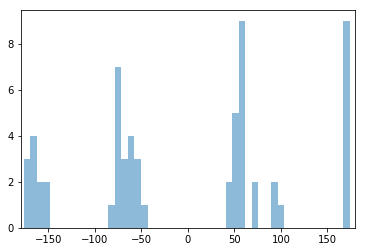

In [78]:
plt.hist(d4[d4["a1"]=="T"]["c1"],bins=50,alpha=.5)
plt.xlim(-180,180)
plt.show()

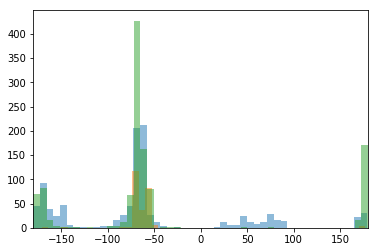

In [68]:
plt.hist(d1[d1["a1"]=="L"]["c1"],bins=50,alpha=.5)
plt.hist(d2[d2["a1"]=="L"]["c1"],bins=50,alpha=.5)
plt.hist(d3[d3["a1"]=="L"]["c1"],bins=50,alpha=.5)
plt.xlim(-180,180)
plt.show()

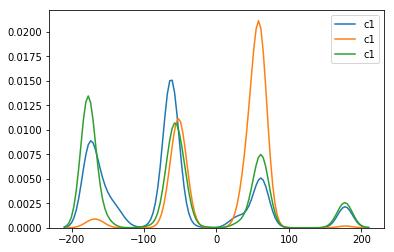

In [60]:
sns.kdeplot(d1[d1["a1"]=="F"]["c1"],bw=10)
sns.kdeplot(d2[d2["a1"]=="F"]["c1"],bw=10)
sns.kdeplot(d3[d3["a1"]=="F"]["c1"],bw=10)
plt.show()

In [247]:
fullframe.to_csv("cyclic_peptide_1.csv",index=None)

In [233]:
so = []
for item in sidechain_orientation:
    if item=="NA":
        so.append((np.nan,np.nan))
    else:
        so.append(item)

In [236]:
so1 = [item[0] for item in so]

In [19]:
data = pd.read_csv("data/cyclic_peptide_1.csv")

In [11]:
tttcwriter = Chem.SDWriter("tttc.sdf")
for i in tttc:
    tttcwriter.write(ctps[i])
tttcwriter.close()

In [76]:
data["Eccentricity"] = eccentricity

In [79]:
data.to_csv("data/cyclic_peptide_2.csv",index=None)

In [74]:
eccentricity = []
for mol in ctps:
    match = mol.GetSubstructMatches(ctps_backbone)[0]
    ringloop = RA.CTPOrder(mol, [match[x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]])
    eccentricity.append(RA.GetEccentricity(mol, ringloop))   

In [20]:
tttt = []
tttc = []
ttcc = []
tctc = []
tccc = []
cccc = []
for idx, item in enumerate(data[["P1","P2","P3","P4"]].values):
    if item.tolist()==["T","T","T","T"]:
        tttt.append(idx)
    elif item.tolist() in [["T","T","T","C"],["T","T","C","T"],["T","C","T","T"],["C","T","T","T"]]:
        tttc.append(idx)
    elif item.tolist() in [["T","T","C","C"],["T","C","C","T"],["C","C","T","T"]]:
        ttcc.append(idx)
    elif item.tolist() in [["T","C","T","C"],["C","T","C","T"]]:
        tctc.append(idx)
    elif item.tolist() in [["C","C","C","T"],["C","C","T","C"],["C","T","C","C"],["T","C","C","C"]]:
        tccc.append(idx)
    else:
        cccc.append(idx)

In [54]:
tttt_eccentricity = [eccentricity[x] for x in tttt]
tttc_eccentricity = [eccentricity[x] for x in tttc]
ttcc_eccentricity = [eccentricity[x] for x in ttcc]
tctc_eccentricity = [eccentricity[x] for x in tctc]
tccc_eccentricity = [eccentricity[x] for x in tccc]
cccc_eccentricity = [eccentricity[x] for x in cccc]

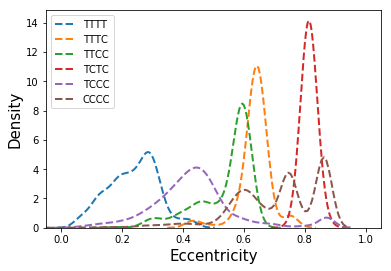

In [70]:
sns.kdeplot(tttt_eccentricity,bw=0.025,label="TTTT",ls="--",lw=2)
sns.kdeplot(tttc_eccentricity,bw=0.025,label="TTTC",ls="--",lw=2)
sns.kdeplot(ttcc_eccentricity,bw=0.025,label="TTCC",ls="--",lw=2)
sns.kdeplot(tctc_eccentricity,bw=0.025,label="TCTC",ls="--",lw=2)
sns.kdeplot(tccc_eccentricity,bw=0.025,label="TCCC",ls="--",lw=2)
sns.kdeplot(cccc_eccentricity,bw=0.025,label="CCCC",ls="--",lw=2)
plt.xlim(-0.05,1.05)
plt.ylabel("Density",size=15)
plt.xlabel("Eccentricity",size=15)
plt.savefig("eccentricity.pdf",dpi=150,bbox_inches="tight")
plt.show()

In [72]:
ttttwriter = Chem.SDWriter("tttt.sdf")
for i in tttt:
    ttttwriter.write(ctps[i])
ttttwriter.close()

In [85]:
tttt_phi_psi = []
for i in tttt:
    match = ctps[i].GetSubstructMatches(ctps_backbone)[0]
    ringloop = [match[x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]]
    four_atom = [[11,0,1,2],[0,1,2,3],[2,3,4,5],[3,4,5,6],[5,6,7,8],[6,7,8,9],[8,9,10,11],[9,10,11,0]]
    tttt_phi_psi.append([rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in item]) for item in four_atom])

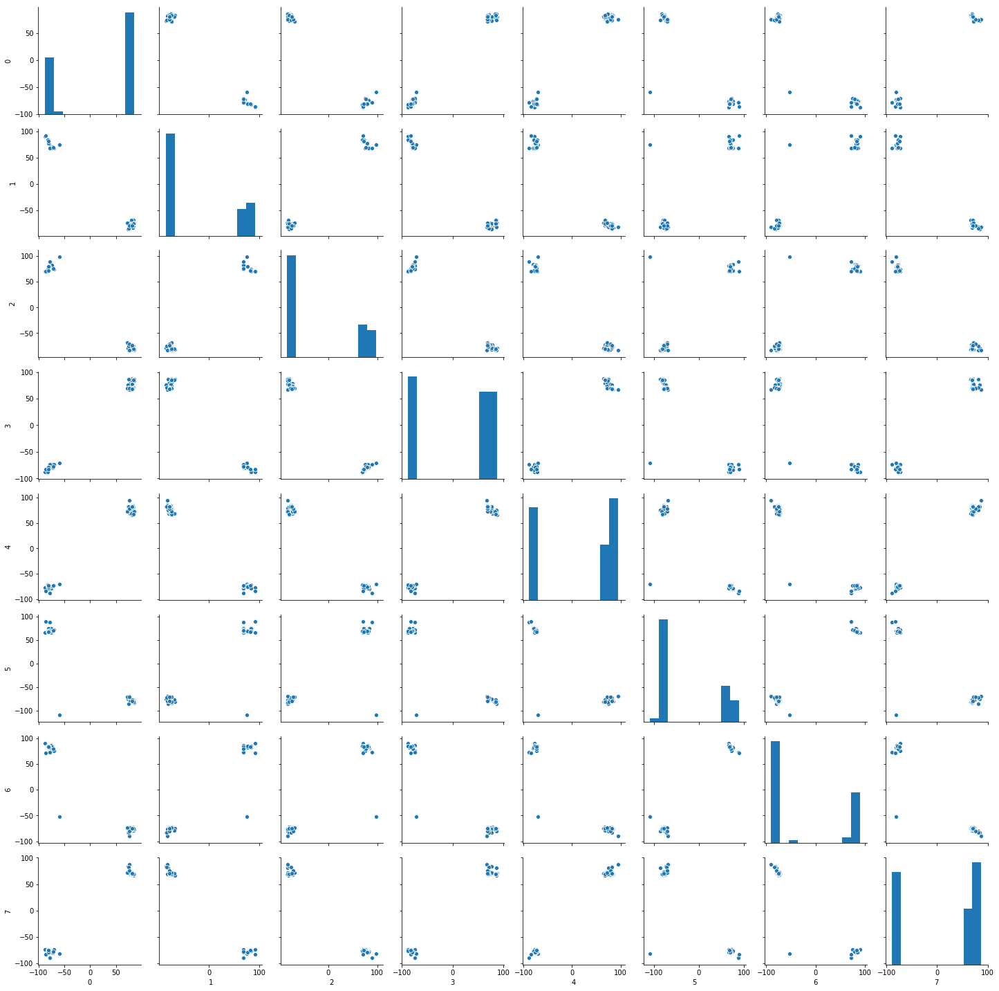

In [88]:
sns.pairplot(pd.DataFrame(tttt_phi_psi))

In [20]:
tttc_phi_psi = []
four_atom = [[11,0,1,2],[0,1,2,3],[3,4,5,6],[2,3,4,5],[6,7,8,9],[5,6,7,8],[9,10,11,0],[8,9,10,11]]
    
for i in tttc:
    match = ctps[i].GetSubstructMatches(ctps_backbone)[0]
    hbond = entropy.GetHBond(ctps[i])
    ringloop = [match[x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]]
    for bond in hbond:
        if (bond[0] in match)==True and (bond[1] in match)==True:
            if match.index(bond[0])==3:
                tttc_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [2,3,4,5]])) 
                tttc_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [3,4,5,6]]))
            elif match.index(bond[0])==7:
                tttc_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [5,6,7,8]])) 
                tttc_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [6,7,8,9]]))
            elif match.index(bond[0])==11:
                tttc_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [8,9,10,11]])) 
                tttc_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [9,10,11,0]])) 
            else:                        
                tttc_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [11,0,1,2]])) 
                tttc_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [0,1,2,3]])) 

11
3
15
11
11
7
15
11
7
3
15
11
7
7
11
3
7
7
11
15
11
15
11
11
15
7
3
11
15
3
11
3
15
3
15
11
3
3
3
7
11
15
15
7
15
11
3
7
15
3
7
11
15
11
3
7
3
7
15
11
3
11
7
7
11
7
11
3
11
7
15
7
7
11
7
11
3
3
7
7
11
11
7
11
3
15
11
15
3
15
15
15
11
3
7
15
11
15
3
3
7
7
3
15
3
7
7
3
7
3
7
7
11
7
15
7
11
15
7
11


In [44]:
pd.DataFrame(np.array(tttc_phi_psi).reshape(int(0.5*len(tttc_phi_psi)),2)).to_csv("tttc_phi_psi.csv",index=None)

In [46]:
tttt_phi_psi = []
for i in tttt:
    match = ctps[i].GetSubstructMatches(ctps_backbone)[0]
    hbond = entropy.GetHBond(ctps[i])
    ringloop = [match[x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]]
    for bond in hbond:
        if (bond[0] in match)==True and (bond[1] in match)==True:
            if match.index(bond[0])==3:
                tttt_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [2,3,4,5]])) 
                tttt_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [3,4,5,6]]))
            elif match.index(bond[0])==7:
                tttt_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [5,6,7,8]])) 
                tttt_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [6,7,8,9]]))
            elif match.index(bond[0])==11:
                tttt_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [8,9,10,11]])) 
                tttt_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [9,10,11,0]])) 
            else:                        
                tttt_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [11,0,1,2]])) 
                tttt_phi_psi.append(rdMolTransforms.GetDihedralDeg(ctps[i].GetConformer(),*[ringloop[x] for x in [0,1,2,3]])) 

In [53]:
pd.DataFrame(np.array(tttt_phi_psi).reshape(188,2)).to_csv("tttt_phi_psi.csv",index=None)

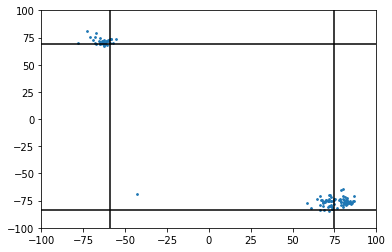

In [42]:
plt.scatter(a.iloc[:,0],a.iloc[:,1],s=3)
plt.xlim(-100,100)
plt.ylim(-100,100)
plt.vlines(75,-100,100)
plt.hlines(-84,-100,100)

plt.vlines(-59,-100,100)
plt.hlines(69,-100,100)
plt.show()

In [16]:
import entropy

In [124]:
tps = pd.DataFrame(np.array(tttt_phi_psi).reshape(216,2))
tps1= pd.DataFrame(np.array(tttc_phi_psi).reshape(int(len(tttc_phi_psi)/2),2))

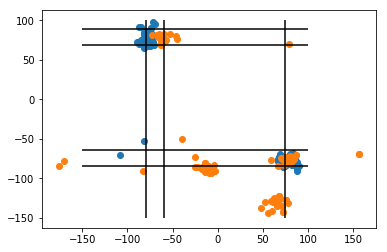

In [132]:
plt.scatter(tps.iloc[:,0],tps.iloc[:,1])
plt.scatter(tps1.iloc[:,0],tps1.iloc[:,1])
plt.vlines(75,-150,100)
plt.hlines(-64,-150,100)
plt.hlines(-64-20,-150,100)

plt.vlines(-79,-150,100)
plt.vlines(-59,-150,100)
plt.hlines(69,-150,100)
plt.hlines(89,-150,100)
plt.show()

In [299]:
cistransframe = pd.DataFrame(cistrans,columns=["P1","P2","P3","P4"])
amplitude = pd.DataFrame([item[0] for item in cp],columns=["q2","q3","q4","q5","q6"])
phaseangle = pd.DataFrame([item[1] for item in cp], columns=["phi2","phi3","phi4","phi5"])
aaframe = pd.DataFrame(aatype,columns=["AA1","AA2","AA3","AA4"])
alphaframe = pd.DataFrame(alpha,columns=["a1","a2","a3","a4"])
betaframe = pd.DataFrame(beta,columns=["b1","b2","b3","b4"])
fullframe = pd.concat([aaframe,amplitude,phaseangle,cistransframe,alphaframe,betaframe],axis=1)

In [300]:
fullframe.to_csv("data/cyclic_peptide_1.csv",index=None)

In [110]:
sidechain_orientation = []
sidechain = []
for mol in [ctps[x] for x in range(13)]:
    match = mol.GetSubstructMatches(backbone)[0]
    ringloop = RA.CTPOrder(mol, [match[x] for x in [0,2,3,5,7,8,10,12,13,15,17,18]])
    print(ringloop)
    idxs = [1,4,7,10] 
    aminoacids = [RA.GetAminoAcidType(mol,ringloop[x]) for x in idxs]
    sidechain.append(aminoacids)
    sidechain_firstatom = [RA.GetSideChainFirstAtoms(mol, ringloop[x], aminoacids[i]) for i,x in enumerate([1,4,7,10])]
    for i,j in enumerate(sidechain_firstatom):
        if j=="NA":
            sidechain_orientation.append("NA")
        else:
            sidechain_orientation.append(RA.GetRingSubstituentPosition(mol, ringloop, (ringloop[idxs[i]],j)))

[20, 22, 23, 24, 10, 11, 12, 14, 15, 16, 18, 19]
[19, 21, 22, 23, 25, 26, 27, 13, 14, 15, 17, 18]
[10, 12, 13, 14, 16, 17, 18, 20, 21, 22, 8, 9]
[3, 5, 11, 12, 14, 15, 16, 18, 24, 25, 1, 2]
[21, 7, 8, 9, 11, 12, 13, 15, 16, 17, 19, 20]
[18, 20, 21, 22, 8, 9, 10, 12, 13, 14, 16, 17]
[15, 17, 18, 19, 21, 22, 23, 9, 10, 11, 13, 14]
[18, 20, 21, 22, 24, 25, 26, 12, 13, 14, 16, 17]
[19, 21, 22, 23, 25, 26, 27, 13, 14, 15, 17, 18]
[14, 16, 17, 18, 4, 5, 6, 8, 9, 10, 12, 13]
[15, 17, 23, 24, 3, 4, 5, 7, 10, 11, 13, 14]
[18, 20, 21, 22, 8, 9, 10, 12, 13, 14, 16, 17]
[18, 20, 21, 22, 24, 25, 26, 12, 13, 14, 16, 17]


In [107]:
sidechain[12]

['E', 'S', 'L', 'C']

In [121]:
match = ctps[12].GetSubstructMatches(backbone)[0]
ringloop = RA.CTPOrder(ctps[12], [match[x] for x in [0,2,3,5,7,8,10,12,13,15,17,18]])
print(ringloop)
print(RA.CTPOrder(ctps[12],ringloop))
#print(RA.GetAminoAcidType(ctps[12],12))
#print(RA.GetAminoAcidType(ctps[12],16))
#print(RA.GetAminoAcidType(ctps[12],20))
#print(RA.GetAminoAcidType(ctps[12],24))

[10, 7, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[26, 12, 13, 14, 16, 17, 18, 20, 21, 22, 24, 25]
[4, 10, 7, 11]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[26, 12, 13, 14, 16, 17, 18, 20, 21, 22, 24, 25]


In [58]:
sidechain_orientation_1 =  []
for item in sidechain_orientation:
    if item=="NA":
        sidechain_orientation_1.append(("NA","NA"))
    else:
        sidechain_orientation_1.append(item)

In [77]:
sidechain

[]

In [73]:
t = pd.DataFrame(pd.DataFrame(sidechain_orientation_1)[0].values.reshape(8661,4))

In [15]:
one = [4,3,5,6]
two = [9,8,10,11]
three = [14,13,15,16]
four = [19,18,0,1]
torsions = [one, two, three, four]
cistrans = []
angle_one = [3,2,0]
angle_two = [8,7,5]
angle_three = [13,12,10]
angle_four = [18,17,15]
angle_list = [angle_one,angle_two, angle_three, angle_four]
angle = []
for idx, mol in enumerate(ctps):
    matches = mol.GetSubstructMatches(backbone)[0]
    torsion = []
    for item in torsions:
        torsion.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(),*[matches[x] for x in item]))
    for t in torsion:
        if np.abs(t)<1:
            cistrans.append("C")
        else:
            cistrans.append("T")
    for item in angle_list:
        angle.append(rdMolTransforms.GetAngleDeg(mol.GetConformer(),*[matches[x] for x in item]))

In [16]:
angleframe = pd.DataFrame(np.array(angle).reshape(8661,4))
cistransframe = pd.DataFrame(np.array(cistrans).reshape(8661,4))

In [17]:
alltrans = [["T","T","T","T"]]
allcis = [["C","C","C","C"]]
onecis = [["T","T","T","C"],["T","T","C","T"],["T","C","T","T"],["C","T","T","T"]]
twocis = [["T","T","C","C"],["T","C","C","T"],["C","C","T","T"],["C","T","T","C"]]
threecis = [["C","C","C","T"],["C","C","T","C"],["C","T","C","C"],["T","C","C","C"]]
alternate = [["T","C","T","C"],["C","T","C","T"]]

In [18]:
allidxs = [[],[],[],[],[],[]]
for idx,i in enumerate(np.array(cistrans).reshape(8661,4)):
    if i.tolist() in alltrans:
        allidxs[0].append(idx)
    elif i.tolist() in allcis:
        allidxs[1].append(idx)
    elif i.tolist() in onecis:
        allidxs[2].append(idx)
    elif i.tolist() in twocis:
        allidxs[3].append(idx)
    elif i.tolist() in threecis:
        allidxs[4].append(idx)
    elif i.tolist() in alternate:
        allidxs[5].append(idx)
    else:
        continue

In [19]:
for item in allidxs:
    print(len(item))

54
3497
95
420
3786
809


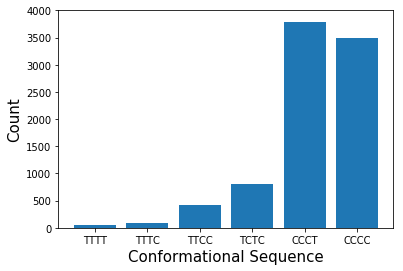

In [71]:
x = ["TTTT","TTTC","TTCC","TCTC","CCCT","CCCC"]
y = [54,95,420,809,3786,3497]
plt.bar(x,y)
plt.ylim(0,4000)
plt.xlabel("Conformational Sequence",size=15)
plt.ylabel("Count",size=15)
plt.savefig("cistrans_count.pdf",dpi=150,bbox_inches="tight")
plt.show()

In [72]:
data = pd.read_csv("peptideframe.csv")

In [143]:
lp = []
for idx, i in enumerate(a):
    if i.tolist() in [["C","T","T","T"],["T","T","T","C"],["T","T","C","T"]]:
        lp.append(idx)

In [24]:
lw = Chem.SDWriter("tttt.sdf")
for i in lp:
    lw.write(ctps[i])
lw.close()

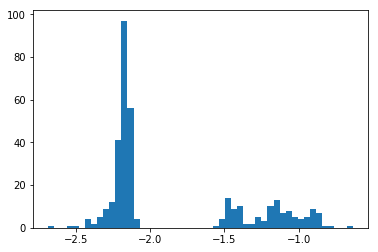

In [139]:
plt.hist(data.iloc[lp,:]["phi4"],bins=50)
plt.show()

In [173]:
sns.pairplot(q1.iloc[:,:4])

NameError: name 'q1' is not defined

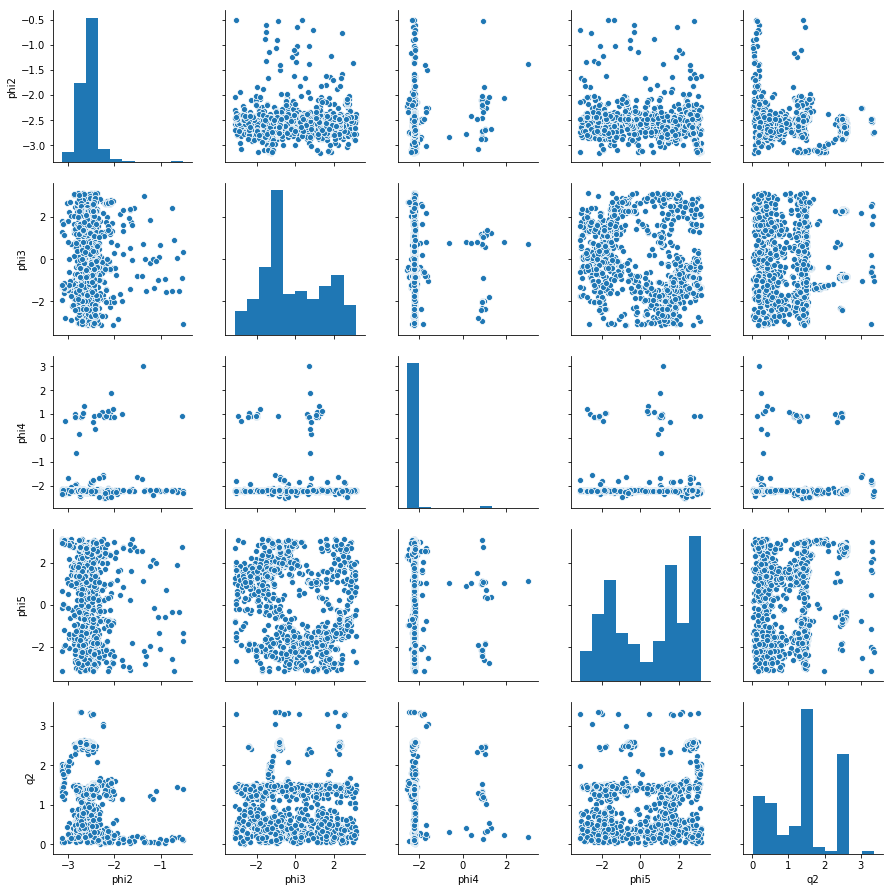

In [43]:
q1 = data.iloc[lp,:]
q2 = q1[q1["phi2"]<-.5]
sns.pairplot(q2.iloc[:,:5])

(array([ 64.,  63.,  56.,  65.,  59.,  42.,  52.,  34.,  24.,  36.,  27.,
         38., 132., 390., 484., 196.,  46.,  31.,  18.,  20.,  20.,  18.,
         16.,  16.,  22.,  18.,  24.,  30.,  33.,  26.,  31.,  31.,  35.,
         53.,  58.,  63.,  58.,  68.,  78.,  83.,  84.,  71.,  81.,  76.,
         92.,  95.,  78.,  91.,  97.,  74.]),
 array([9.23812469e-04, 1.26495058e-01, 2.52066304e-01, 3.77637550e-01,
        5.03208796e-01, 6.28780042e-01, 7.54351288e-01, 8.79922534e-01,
        1.00549378e+00, 1.13106503e+00, 1.25663627e+00, 1.38220752e+00,
        1.50777876e+00, 1.63335001e+00, 1.75892126e+00, 1.88449250e+00,
        2.01006375e+00, 2.13563499e+00, 2.26120624e+00, 2.38677749e+00,
        2.51234873e+00, 2.63791998e+00, 2.76349122e+00, 2.88906247e+00,
        3.01463372e+00, 3.14020496e+00, 3.26577621e+00, 3.39134745e+00,
        3.51691870e+00, 3.64248995e+00, 3.76806119e+00, 3.89363244e+00,
        4.01920368e+00, 4.14477493e+00, 4.27034618e+00, 4.39591742e+00,
        4.

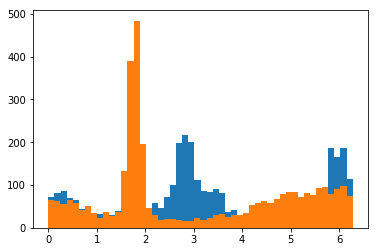

In [40]:
plt.hist(np.mod(data.iloc[lp,:]["phi3"]-data.iloc[lp,:]["phi5"],np.pi*2),bins=50)
plt.hist(np.mod(data.iloc[lp,:]["phi3"]+data.iloc[lp,:]["phi5"],np.pi*2),bins=50)

In [13]:
data = pd.read_csv("peptideframe.csv")

In [10]:
qqqq = [['C', 'C', 'C', 'C'],
 ['C', 'C', 'T', 'T'],
 ['T', 'C', 'T', 'C'],
 ['C', 'T', 'T', 'C'],
 ['C', 'T', 'C', 'T'],
 ['T', 'T', 'C', 'C'],
 ['T', 'C', 'C', 'T'],
 ['T', 'T', 'T', 'T'],['C', 'C', 'T', 'C'], ['C', 'T', 'C', 'C'],['T', 'C', 'C', 'C'],['C', 'C', 'C', 'T']]

In [11]:
qqqqq =[]
w = [0]*12
for item in cc:
    c = a[item]
    w[qqqq.index(c.tolist())]+=1
        

NameError: name 'cc' is not defined

In [201]:
w

[1907, 14, 54, 19, 39, 9, 4, 3, 26, 17, 14, 17]

In [202]:
qqqqq

[]

In [125]:
kidx = []
for idx, item in enumerate(a):
    if item.tolist() in  [["C","C","C","T"],["C","T","C","C"],["C","C","T","C"],["T","C","C","C"]]:
        kidx.append(idx)

In [126]:
len(kidx)

3786

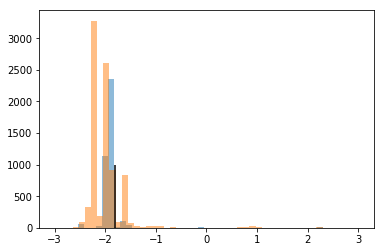

In [241]:
plt.hist(data.iloc[kidx,:]["phi4"],bins=50,alpha=0.5)
plt.hist(data["phi4"],bins=50,alpha=.5)
plt.vlines(-1.8,0,1000)
plt.show()

In [291]:
["T","C","T","C"],["C","T","C","T"]
yidx = []
for idx, item in enumerate(a):
    if item.tolist() in  [["T","T","C","C"],["C","C","T","T"],["C","T","T","C"],["T","C","C","T"],
                          ["T","T","T","C"],["T","C","T","T"],["T","T","C","T"],["C","T","T","T"]]:
        yidx.append(idx)
print(len(yidx))

515


In [292]:
xidx = []
for idx, item in enumerate(a):
    if item.tolist() in  [["C","C","C","C"]]:
        xidx.append(idx)
print(len(xidx))

3497


In [293]:
q1idx = []
for idx, item in enumerate(a):
    if item.tolist() in [["T","T","C","C"],["C","C","T","T"],["T","C","C","T"]]:
        q1idx.append(idx)
[["T","T","T","C"],["T","T","C","T"],["T","C","T","T"],["C","T","T","T"]]
["C","C","C","T"],["C","T","C","C"],["C","C","T","C"]
q2idx = []
for idx, item in enumerate(a):
    if item.tolist() in [["T","T","T","C"],["T","C","T","T"],["T","T","C","T"],["C","T","T","T"]]:
        q2idx.append(idx)

In [294]:
len(q2idx)

95

In [295]:
,["T","T","C","C"],["C","C","T","T"],["T","C","C","T"]

SyntaxError: invalid syntax (<ipython-input-295-cfea9fc124cb>, line 1)

In [238]:
np.rad2deg(-1.7)

-97.40282517223994

In [24]:
Chem.MolToSmiles(mol)

'CC(C)[C@@H]1NC(=O)[C@H](CS)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](Cc2ccc(O)cc2)NC1=O'

In [4]:
seqname = pd.read_csv("aminoacid_order.csv")

In [5]:
cp = []
orientation = []
aatype = []
for idx, mol in enumerate(ctps):
    matches = mol.GetSubstructMatches(ctps_backbone2)
    backbone = RA.CTPOrder(mol, [matches[0][x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]])
    coord = np.array([mol.GetConformer().GetAtomPosition(x) for x in backbone])
    c_coord = RA.Translate(coord)
    cp.append(RA.GetRingPuckerCoords(c_coord))
    orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (0,1)))
    orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (4,5)))
    orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (8,9)))
    orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (12,13)))
#     aatype.append(GetAminoAcidType(mol,backbone[1]))
#     aatype.append(GetAminoAcidType(mol,backbone[4]))
#     aatype.append(GetAminoAcidType(mol,backbone[7]))
#     aatype.append(GetAminoAcidType(mol,backbone[10]))

[10, 7, 1, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 7, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 2, 11, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 13, 7, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 1, 1, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 10, 7, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 7, 11, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 7, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 7, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 13, 7, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 13, 7, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 7, 5, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 7, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 7, 5, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 7, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 1, 11, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 11, 7, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 7, 10, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[

[0, 13, 13, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 10, 7, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 13, 7, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 10, 13, 7]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 13, 10, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 13, 11, 7]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 7, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 7, 13, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[1, 1, 9, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 0, 13, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 0, 7, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 7, 11, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 7, 12, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 0, 11, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 13, 7, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 5, 13, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 7, 12, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 1, 1, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[

[11, 11, 7, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 1, 1, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 0, 11, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 10, 7, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 10, 7, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 7, 5, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 0, 11, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 7, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 10, 1, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 11, 11, 7]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 1, 10, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 7, 2, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 7, 8, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 7, 10, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 10, 7, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 7, 7, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 10, 13, 7]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[1, 10, 7, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[

[9, 2, 13, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 1, 11, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 9, 1, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 6, 9, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 7, 13, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 2, 2, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 1, 11, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 9, 2, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 2, 1, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[8, 12, 9, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 2, 8, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 1, 6, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 13, 11, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 0, 7, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 13, 11, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 9, 13, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 1, 2, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 1, 13, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 9, 2, 1

[9, 8, 9, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 11, 7, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 5, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 2, 9, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 9, 7, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 11, 9, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 6, 9, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 12, 9, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 12, 9, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 10, 11, 8]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 5, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 10, 13, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 9, 4, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 8, 9, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 8, 9, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 1, 11, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 12, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 0, 6, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 2, 9,

[2, 8, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 12, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 9, 0, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 8, 1, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 9, 10, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[4, 6, 9, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 10, 7, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 6, 6, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 9, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 9, 5, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 13, 10, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[12, 9, 10, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 1, 13, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 2, 9, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 9, 5, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[8, 9, 12, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 13, 8, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 0, 1, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 11, 9, 4

[11, 11, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 5, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 0, 11, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 0, 10, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 1, 10, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 0, 10, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 1, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 10, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 12, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[12, 10, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 1, 10, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[6, 10, 11, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[8, 11, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 2, 8, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 10, 11, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 2, 10, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 0, 10, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 10, 0, 10]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 

[0, 0, 10, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 0, 10, 1]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 2, 11, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 11, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 10, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 0, 10, 2]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 0, 6, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 2, 12, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 5, 1, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 12, 10, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 2, 10, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 10, 1, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 11, 5, 5]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 0, 10, 11]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 11, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 11, 11, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 10, 4, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 2, 10, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 

[1, 2, 10, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[12, 10, 2, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 0, 0, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 10, 8, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 11, 12, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 5, 10, 11]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 12, 10, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 13, 5, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 8, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 0, 10, 11]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 12, 10, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[12, 13, 5, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 10, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 1, 10, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 10, 8, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[4, 6, 10, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 0, 10, 2]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 8, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4,

[4, 10, 8, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 0, 10, 0]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 8, 8, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 10, 11, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 1, 0, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 9, 10, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 9, 13, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 10, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 0, 12, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 11, 1, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 1, 4, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 9, 0, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 1, 9, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 9, 2, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 11, 0, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 12, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 0, 9, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 9, 8, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 11, 10, 4

[2, 1, 9, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 12, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 9, 9, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 2, 9, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 5, 13, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 10, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 1, 0, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 4, 8, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 0, 0, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 11, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 9, 6, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 9, 1, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 1, 9, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 11, 2, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 7, 5, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 0, 9, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 9, 0, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 2, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 12, 6, 4]
1
[3,

[9, 4, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 9, 10, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 6, 10, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 1, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 9, 13, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 9, 7, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 9, 10, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 9, 0, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 11, 2, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 1, 0, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 10, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 2, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 13, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 9, 8, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 1, 9, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 6, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[1, 10, 0, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 9, 10, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 5, 9, 7]
3

[11, 5, 9, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 5, 5, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 5, 7, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 11, 5, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 2, 9, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 5, 0, 1]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 5, 2, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[8, 5, 8, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 5, 2, 5]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 1, 11, 5]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 5, 13, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 5, 9, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 5, 8, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 5, 1, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 7, 11, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 0, 2, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 5, 9, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 5, 11, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 11,

[11, 11, 5, 2]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 5, 1, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[6, 5, 5, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 11, 2, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 5, 2, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 8, 5, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 8, 5, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 9, 1, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 5, 8, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 11, 5, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 5, 5, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 5, 0, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 1, 10, 5]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 11, 3, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 8, 5, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 8, 5, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 8, 5, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 11, 5, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 5, 2, 6

[8, 5, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 5, 5, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 8, 5, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 5, 2, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 5, 12, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 5, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[8, 5, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 5, 0, 5]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 1, 10, 5]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 11, 5, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 2, 5, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 5, 10, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 1, 2, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 5, 2, 1]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 5, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[6, 8, 5, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 8, 5, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 2, 10, 5]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 5, 1, 8]
2
[6, 

[8, 5, 1, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 8, 5, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 2, 7, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 8, 5, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[8, 5, 9, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 5, 1, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 10, 0, 10]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 11, 5, 1]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 3, 1, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 7, 11, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 3, 12, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 11, 3, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 12, 3, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 2, 2, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 1, 2, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 1, 10, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 11, 11, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 10, 5, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 8

[5, 1, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 0, 0, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 5, 2, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 8, 3, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 2, 3, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 11, 9, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 9, 2, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 0, 11, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 11, 3, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 13, 11, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 11, 3, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 3, 5, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 9, 9, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 8, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 2, 9, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 7, 11, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[3, 2, 1, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 3, 6, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 11, 2, 1

[12, 3, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 12, 9, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 11, 3, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 3, 7, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 9, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 0, 11, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 3, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 3, 8, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 13, 11, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 11, 3, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 3, 10, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 13, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 0, 13, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 0, 13, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 3, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 12, 1, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 8, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[8, 8, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 

[1, 0, 2, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 1, 13, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 1, 2, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[8, 8, 7, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 0, 7, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 11, 1, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 13, 6, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 0, 2, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 1, 10, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 2, 7, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 12, 11, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 11, 13, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 13, 10, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 0, 2, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 8, 7, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 12, 7, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 10, 0, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 12, 7, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 8, 7, 

[12, 7, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 13, 1, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 7, 5, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 11, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 0, 2, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 10, 10, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 5, 13, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 7, 10, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 7, 5, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[6, 7, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 8, 11, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 13, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 8, 1, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 13, 8, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 6, 7, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 10, 0, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 0, 13, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 6, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 7, 11, 

[8, 7, 13, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 8, 7, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[8, 6, 7, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 12, 10, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 8, 7, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[1, 10, 2, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 2, 7, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 8, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 7, 5, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 10, 13, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 5, 13, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 7, 13, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 6, 7, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 1, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 1, 2, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 8, 7, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 0, 2, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 12, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 

[11, 10, 5, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 1, 1, 1]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 4, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 4, 1, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 10, 5, 10]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 0, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 10, 5, 11]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 1, 1, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 4, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 1, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 10, 5, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 0, 1, 0]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 2, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[6, 0, 2, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 5, 11, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 1, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 4, 6, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 10, 5, 13]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 10, 5, 8

[11, 13, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 2, 10, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 11, 10, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 11, 13, 1]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 11, 13, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[8, 13, 11, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 0, 10, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 8, 12, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 8, 1, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 13, 6, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 8, 13, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 10, 10, 2]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 6, 13, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 2, 10, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 8, 13, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 13, 1, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 13, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 2, 11, 11]
3
[9, 10, 11, 0, 1, 2, 3, 4

[13, 5, 11, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 11, 13, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 1, 11, 11]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 11, 13, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 13, 4, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 13, 11, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 10, 13, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 10, 2, 11]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 10, 0, 11]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 13, 2, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 0, 1, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 13, 8, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 2, 0, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 13, 12, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 2, 0, 11]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 8, 13, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 0, 10, 5]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 11, 8, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2,

[13, 10, 0, 2]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 10, 13, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 11, 13, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 8, 13, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 5, 1, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 13, 5, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 11, 2, 2]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 2, 13, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[6, 13, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 13, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 10, 11, 8]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[12, 6, 13, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 0, 11, 11]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 2, 6, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 0, 13, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 2, 13, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 2, 13, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 13, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3,

[3, 2, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 9, 10, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 9, 9, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[1, 3, 8, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 1, 3, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 9, 13, 8]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 9, 1, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 9, 5, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 4, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 3, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 3, 7, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 10, 9, 7]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[1, 3, 7, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 1, 1, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 1, 3, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 2, 2, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 1, 1, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 9, 1, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 6, 8, 4]
0
[0, 1

[9, 9, 8, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 3, 10, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 0, 1, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 7, 1, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 9, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 5, 5, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 9, 5, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 9, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 7, 9, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 9, 9, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 9, 12, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 9, 5, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 2, 10, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 13, 1, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 1, 2, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 10, 0, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 2, 4, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 9, 8, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 9, 9, 9]
0
[

[7, 9, 1, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 1, 3, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 11, 13, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 10, 9, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 7, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 5, 13, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 1, 9, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 12, 8, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 9, 9, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 2, 12, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 3, 13, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 2, 9, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 10, 1, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 9, 9, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 10, 1, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 3, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 6, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 9, 12, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 1, 11, 4]

[7, 13, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 0, 4, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 5, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 13, 10, 8]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 7, 1, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 10, 1, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 7, 2, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 0, 1, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 13, 13, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 5, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 11, 10, 5]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 0, 1, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 13, 1, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 13, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 13, 11, 8]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 11, 1, 13]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 2, 10, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 6, 13, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 13, 

[13, 1, 7, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 5, 11, 5]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 1, 7, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 11, 10, 10]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 11, 0, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 7, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 2, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 13, 5, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 10, 13, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 13, 11, 8]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 13, 12, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 0, 7, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 1, 11, 10]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 1, 0, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 1, 7, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 7, 2, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 1, 1, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 6, 12, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7

[13, 11, 2, 13]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 13, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 1, 7, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 0, 7, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 0, 0, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 7, 0, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[8, 0, 7, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[6, 10, 13, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 13, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 13, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 11, 0, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 13, 1, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 13, 13, 12]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 13, 12, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 10, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 8, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 1, 7, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 13, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 

[8, 12, 1, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 2, 2, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 8, 1, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[6, 0, 12, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 12, 12, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 12, 0, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[6, 8, 1, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 10, 5, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 8, 2, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[8, 6, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[6, 6, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 8, 2, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 8, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 0, 6, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 2, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 12, 8, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 8, 6, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 0, 2, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 10, 5, 12]
2


[0, 12, 6, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 1, 2, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 12, 1, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 8, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 2, 0, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 8, 0, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 12, 8, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 8, 0, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 1, 2, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 12, 0, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[8, 12, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[12, 8, 12, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 6, 12, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 1, 1, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 5, 9, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 6, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 0, 1, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 0, 4, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 10, 5, 3]
1


[0, 0, 6, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 6, 4, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 6, 8, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 1, 12, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[6, 6, 6, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 8, 1, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 1, 1, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 4, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 10, 5, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 2, 0, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[6, 6, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[4, 8, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 1, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 12, 12, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 1, 6, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 6, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 2, 2, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 8, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 0, 2, 6]


[13, 0, 11, 1]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 2, 10, 10]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 5, 1, 11]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 13, 1, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 13, 11, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 10, 12, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 1, 0, 1]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 6, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 1, 13, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 10, 11, 10]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 1, 13, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 10, 4, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 2, 11, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 2, 0, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 0, 2, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 0, 13, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 1, 8, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 4, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 

[0, 13, 11, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 13, 10, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 10, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 0, 2, 1]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 1, 13, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 10, 0, 10]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 13, 2, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 2, 12, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 5, 13, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 10, 1, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 0, 8, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 10, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 8, 10, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 13, 11, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 8, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 8, 10, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 10, 10, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 2, 2, 1]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1,

[13, 12, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 6, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 12, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 13, 5, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 13, 5, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 11, 10, 2]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 10, 0, 0]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 13, 10, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 10, 10, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 0, 13, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 0, 0, 1]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 1, 11, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 5, 11, 10]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 11, 10, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 6, 10, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 0, 0, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 11, 2, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 8, 10, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11,

[7, 3, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 5, 5, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 1, 13, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 10, 3, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 10, 3, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 0, 10, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 10, 3, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 3, 11, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 13, 3, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 5, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 7, 3, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 2, 10, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 13, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[8, 7, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 3, 13, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 10, 3, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 1, 10, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 0, 13, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 

[5, 11, 2, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 2, 13, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 5, 3, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 3, 13, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 5, 3, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 10, 13, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 1, 13, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 10, 3, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 2, 7, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 5, 9, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 5, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 10, 13, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 2, 2, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 5, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 3, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 7, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 3, 10, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 3, 13, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 3

[2, 13, 3, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 1, 13, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 13, 7, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 3, 10, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 3, 13, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 3, 5, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 3, 10, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 3, 10, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 13, 3, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 5, 10, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 13, 3, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 13, 3, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 10, 10, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[6, 7, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 2, 7, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 2, 7, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 1, 10, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 7, 3, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11,

[3, 10, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 13, 2, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[8, 0, 3, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 0, 0, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[6, 6, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 3, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 1, 0, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 3, 6, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 2, 3, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 5, 10, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[3, 13, 11, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 9, 5, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 11, 12, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 1, 1, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 8, 11, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 3, 13, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 5, 11, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 9, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 5, 10, 7]
3


[2, 2, 3, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 7, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 7, 2, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 2, 3, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 10, 2, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 3, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 5, 9, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 5, 2, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 9, 7, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 8, 10, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 10, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 9, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 0, 3, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 6, 3, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 6, 3, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 5, 5, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 3, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 10, 2, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 5, 0, 3]
2
[6

[3, 9, 13, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 10, 2, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 1, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 9, 11, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 0, 3, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 2, 3, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 12, 7, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 10, 9, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 10, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 7, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 6, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 13, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 6, 3, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[8, 0, 3, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[13, 1, 2, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 2, 3, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 3, 0, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 0, 0, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 8, 0, 6]
2

[5, 13, 7, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 5, 12, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 5, 2, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 11, 10, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 3, 4, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 10, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 11, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 5, 10, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 0, 5, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 5, 11, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 0, 5, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 10, 3, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 0, 5, 0]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 5, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 5, 10, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 2, 5, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 1, 1, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 4, 4, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 5, 9, 7]
0
[0,

[10, 0, 5, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 5, 13, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 0, 5, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 5, 0, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 1, 5, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 5, 0, 3]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 9, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 0, 5, 7]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 5, 12, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 1, 5, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 5, 2, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 8, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[1, 5, 2, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 2, 7, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 5, 13, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 5, 10, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 5, 11, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 0, 5, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 0, 5, 9]
3
[9

[7, 11, 9, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 9, 0, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 9, 0, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 13, 11, 9]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 2, 11, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 9, 11, 7]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 9, 7, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 9, 7, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 2, 13, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 11, 9, 8]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 9, 12, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 10, 9, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 10, 9, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 13, 13, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 9, 13, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 13, 9, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 9, 11, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 9, 10, 7]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 

[11, 9, 13, 7]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[0, 13, 9, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 2, 1, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 2, 10, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 2, 10, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 5, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 9, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 5, 1, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 11, 2, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 11, 9, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 13, 2, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[7, 9, 1, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 0, 10, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 9, 2, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 9, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 9, 11, 8]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 13, 9, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 11, 9, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 13

[9, 5, 3, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 11, 11, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 5, 8, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 11, 9, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[9, 7, 0, 7]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 10, 9, 7]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 9, 1, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 10, 10, 9]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 10, 9, 7]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 9, 1, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[10, 9, 1, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[8, 11, 9, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[7, 9, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 11, 10, 9]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[10, 10, 9, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 5, 5, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 10, 13, 9]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[2, 11, 13, 9]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[

[12, 9, 3, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 1, 9, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 1, 5, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 10, 13, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 5, 2, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 3, 7, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 3, 10, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 3, 6, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 3, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 5, 5, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[1, 5, 13, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 1, 5, 2]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 7, 3, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 3, 3, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 2, 9, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 3, 8, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 9, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 3, 13, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 9, 9, 3]
0
[

[7, 3, 7, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 3, 1, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 3, 4, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 3, 3, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 3, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 0, 3, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 7, 3, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 2, 3, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 0, 1, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 10, 3, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 3, 3, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 9, 3, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 3, 3, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 3, 5, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 1, 5, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 5, 8, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 0, 11, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 9, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 13, 13, 3]
1
[

[7, 9, 9, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[13, 3, 3, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 11, 9, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[3, 3, 7, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[10, 3, 5, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 1, 5, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 9, 3, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 2, 3, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 3, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 3, 12, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 3, 7, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 3, 9, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 5, 7, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[3, 3, 11, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 9, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 5, 6, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[9, 10, 9, 3]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[3, 3, 2, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 10, 1, 3]
2


[11, 8, 6, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 11, 12, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 8, 8, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[0, 11, 11, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 11, 11, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 0, 2, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 1, 2, 1]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 11, 4, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 11, 4, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 2, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 11, 6, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 5, 5, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 6, 11, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 11, 12, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 5, 12, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[12, 4, 11, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 11, 2, 8]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[8, 12, 8, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1

[11, 1, 2, 8]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 1, 0, 0]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 12, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 11, 8, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 6, 6, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 4, 8, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 11, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 8, 2, 8]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 8, 2, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 5, 10, 1]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 2, 11, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 11, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[6, 2, 11, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 12, 11, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 1, 6, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[11, 12, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[11, 12, 8, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[0, 8, 8, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]


[12, 8, 11, 6]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 2, 8, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[1, 13, 5, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 1, 8, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 11, 1, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 11, 11, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 6, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[6, 11, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 5, 2, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[11, 0, 1, 2]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[2, 8, 11, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 12, 11, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[1, 11, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 11, 6, 4]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 8, 1, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[1, 11, 1, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[12, 2, 11, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[6, 11, 0, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[6

[5, 6, 0, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[3, 12, 5, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[11, 2, 5, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 7, 2, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[12, 5, 2, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 5, 10, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[2, 5, 1, 9]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 11, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 2, 5, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 1, 1, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[10, 6, 5, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[6, 5, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 1, 0, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 0, 13, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 7, 10, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 2, 5, 2]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 5, 8, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[7, 2, 5, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 0, 1, 6]


[12, 5, 7, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 9, 2, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 8, 3, 12]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[13, 2, 5, 9]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[9, 2, 5, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 12, 5, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 2, 3, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 1, 7, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[12, 5, 3, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 8, 7, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[1, 5, 5, 0]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[8, 2, 5, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[6, 5, 2, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[2, 5, 13, 3]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[13, 2, 5, 1]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 7, 2, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[9, 2, 5, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[8, 12, 5, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 10, 13, 12]
0
[

[11, 12, 5, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 5, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 5, 3, 4]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[5, 10, 9, 6]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 1, 9, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 8, 9, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 9, 8, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[6, 5, 9, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 9, 3, 6]
2
[6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
[6, 5, 6, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 0, 11, 12]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[7, 2, 5, 4]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 2, 5, 3]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[5, 5, 10, 1]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 1, 13, 6]
3
[9, 10, 11, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[6, 5, 7, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[6, 12, 5, 4]
1
[3, 4, 5, 6, 7, 8, 9, 10, 11, 0, 1, 2]
[5, 11, 11, 12]
0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[5, 13, 11, 6]


In [32]:
phaseangle = pd.DataFrame([item[1] for item in cp])
amplitude = pd.DataFrame(item[0] for item in cp)

In [111]:
a = pd.DataFrame(np.sqrt(np.square(amplitude).sum(axis=1)))


In [117]:
eccentricity = pd.read_csv("eccentricity.csv")

In [153]:
q = eccentricity.iloc[allidxs[4]]


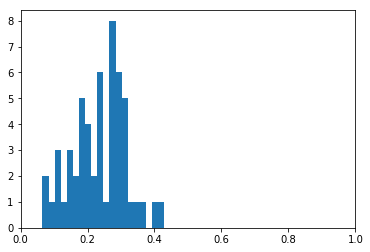

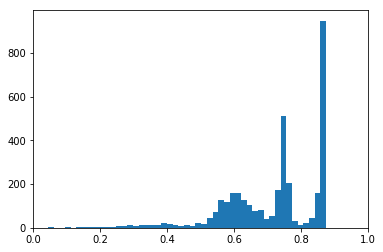

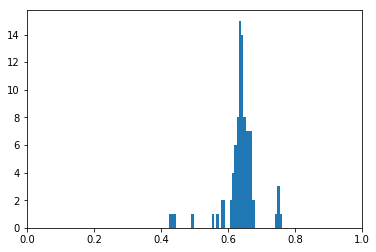

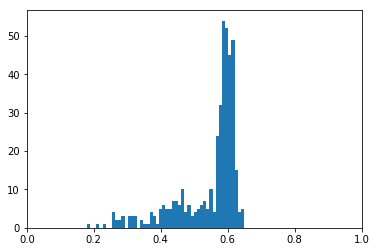

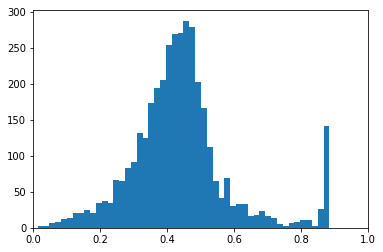

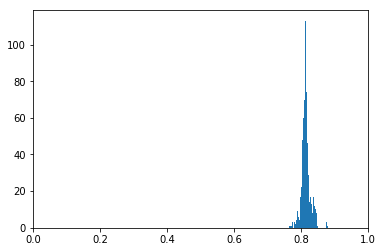

In [131]:
plt.hist(eccentricity.iloc[allidxs[0]].values,bins=20)
plt.xlim(0,1)
plt.show()

plt.hist(eccentricity.iloc[allidxs[1]].values,bins=50)
plt.xlim(0,1)
plt.show()

plt.hist(eccentricity.iloc[allidxs[2]].values,bins=50)
plt.xlim(0,1)
plt.show()

plt.hist(eccentricity.iloc[allidxs[3]].values,bins=50)
plt.xlim(0,1)
plt.show()

plt.hist(eccentricity.iloc[allidxs[4]].values,bins=50)
plt.xlim(0,1)
plt.show()

plt.hist(eccentricity.iloc[allidxs[5]].values,bins=50)
plt.xlim(0,1)
plt.show()


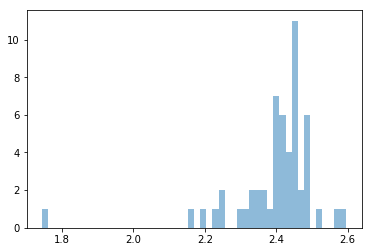

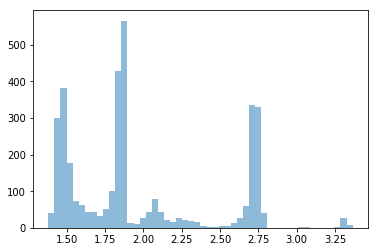

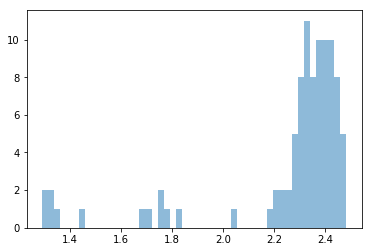

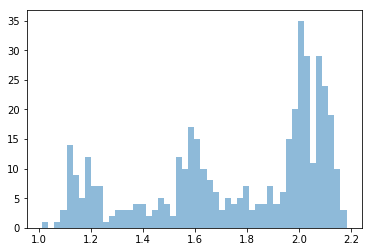

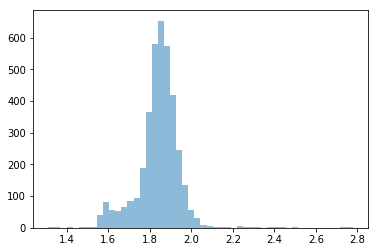

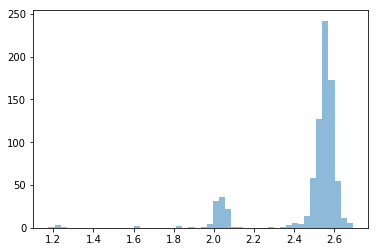

In [116]:
plt.hist(a.iloc[allidxs[0]].values,bins=50,alpha=.5)
plt.show()
plt.hist(a.iloc[allidxs[1]].values,bins=50,alpha=.5)
plt.show()
plt.hist(a.iloc[allidxs[2]].values,bins=50,alpha=.5)
plt.show()
plt.hist(a.iloc[allidxs[3]].values,bins=50,alpha=.5)
plt.show()
plt.hist(a.iloc[allidxs[4]].values,bins=50,alpha=.5)
plt.show()
plt.hist(a.iloc[allidxs[5]].values,bins=50,alpha=.5)
plt.show()


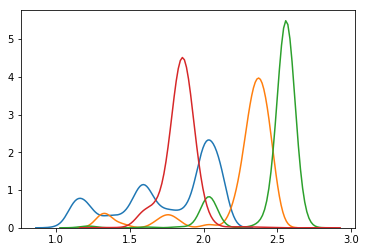

In [171]:
sns.kdeplot(a.iloc[allidxs[3]].values.reshape(len(allidxs[3])),bw=0.05)
sns.kdeplot(a.iloc[allidxs[2]].values.reshape(len(allidxs[2])),bw=0.05)
sns.kdeplot(a.iloc[allidxs[5]].values.reshape(len(allidxs[5])),bw=0.05)
sns.kdeplot(a.iloc[allidxs[4]].values.reshape(len(allidxs[4])),bw=0.05)

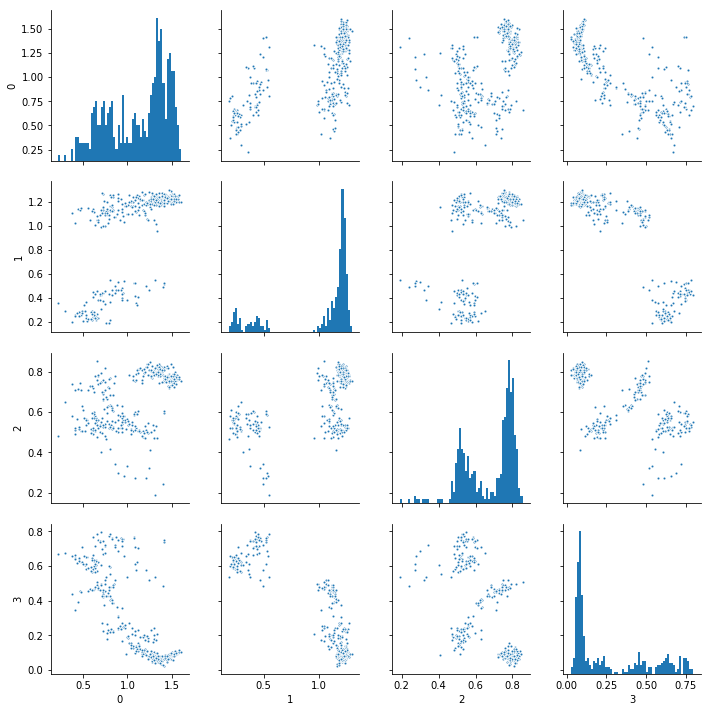

In [43]:
sns.pairplot(amplitude.iloc[allidxs[3],:4],plot_kws=dict(s=8),diag_kws=dict(bins=60))

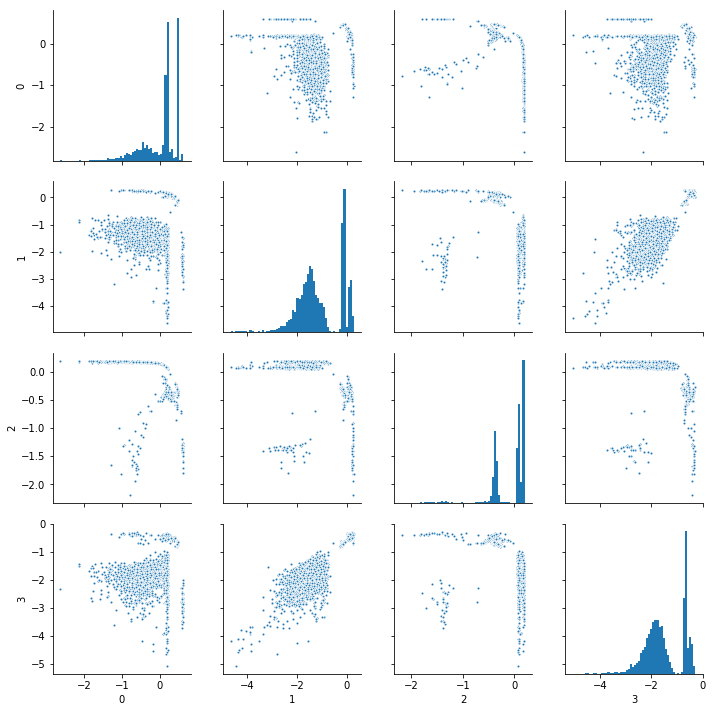

In [41]:
sns.pairplot(amplitude.iloc[allidxs[1],:4].apply(np.sqrt).apply(np.log),plot_kws=dict(s=8),diag_kws=dict(bins=60))

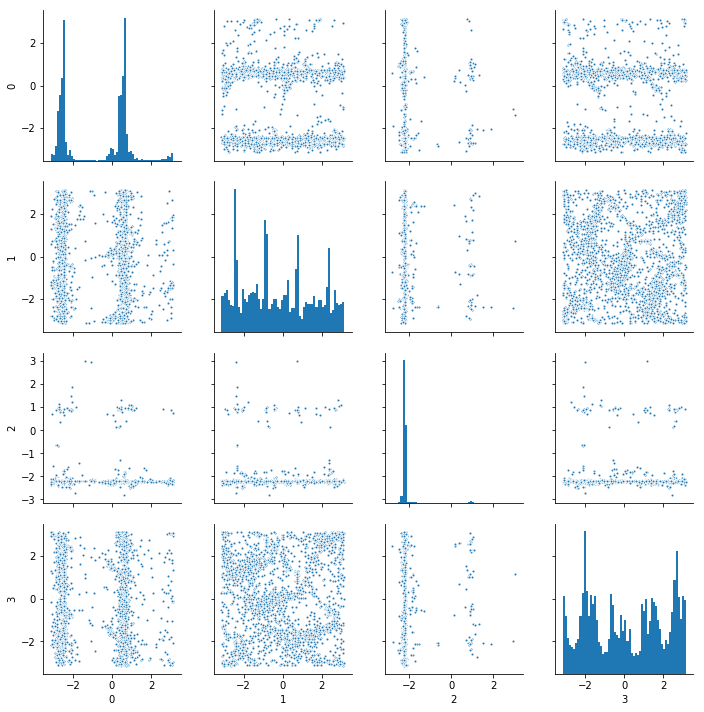

In [31]:
sns.pairplot(phaseangle.iloc[allidxs[1],:],plot_kws=dict(s=8),diag_kws=dict(bins=60))

In [9]:
Chem.MolToSmiles(ctps[1],canonical=True)

'CC(C)C[C@@H]1NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H]([C@@H](C)O)NC1=O'

In [15]:
ctps_backbone = Chem.MolFromSmarts("C1(=O)CNC(=O)CNC(=O)CNC(=O)CN1")

In [16]:
ctps[1].GetSubstructMatches(ctps_backbone)

((6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 4, 5),)

In [19]:
name = []
for mol in ctps:
    match = mol.GetSubstructMatches(ctps_backbone)
    name.append([GetAminoAcidType(mol,match[0][x]) for x in [2,6,10,14]])

In [23]:
pd.DataFrame(name).to_csv("aminoacid_order.csv",index=None)

In [7]:
alanine = Chem.MolFromSmarts("[C;R](N)[CH3X4]")
aspartate = Chem.MolFromSmarts("[C;R](N)[CH2X4][CX3](=[OX1])[OH0-,OH]")
cysteine = Chem.MolFromSmarts("[C;R](N)[CH2X4][SX2H,SX1H0-]")
glutamate = Chem.MolFromSmarts("[C;R](N)[CH2X4][CH2X4][CX3](=[OX1])[OH0-,OH]")
glycine = Chem.MolFromSmarts("[C;R](N)[$([$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H2][CX3](=[OX1])[OX2H,OX1-,N])]")
histidine = Chem.MolFromSmarts("[C;R](N)[CH2X4][#6X3]1:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]1")
leucine = Chem.MolFromSmarts("[C;R](N)[CH2X4][CHX4]([CH3X4])[CH3X4]")
lysine = Chem.MolFromSmarts("[C;R](N)[CH2X4][CH2X4][CH2X4][CH2X4][NX4+,NX3+0]")
phenylalanine = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][cX3H][cX3H][cX3H][cX3H]1")
serine = Chem.MolFromSmarts("[C;R](N)[CH2X4][OX2H]")
threonine = Chem.MolFromSmarts("[C;R](N)[CHX4]([CH3X4])[OX2H]")
tryptophan = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][nX3H][cX3]2[cX3H][cX3H][cX3H][cX3H][cX3]12")
tyrosine = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][cX3H][cX3]([OHX2,OH0X1-])[cX3H][cX3H]1")
valine = Chem.MolFromSmarts("[C;R](N)[CHX4]([CH3X4])[CH3X4]")

#aminoacidss = {0:"A",1:"V",2:"L",3:"F",4:"W",5:"Y",6:"S",7:"T",8:"D",9:"E",10:"H",11:"K",12:"C",13:"G"}
#types = [a for i, a in aminoacid.items()]

def GetAminoAcidType(mol, CA):
    alanine = Chem.MolFromSmarts("[C;R](N)[CH3X4]")
    aspartate = Chem.MolFromSmarts("[C;R](N)[CH2X4][CX3](=[OX1])[OH0-,OH]")
    cysteine = Chem.MolFromSmarts("[C;R](N)[CH2X4][SX2H,SX1H0-]")
    glutamate = Chem.MolFromSmarts("[C;R](N)[CH2X4][CH2X4][CX3](=[OX1])[OH0-,OH]")
    glycine = Chem.MolFromSmarts("[C;R](N)[$([$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H2][CX3](=[OX1])[OX2H,OX1-,N])]")
    histidine = Chem.MolFromSmarts("[C;R](N)[CH2X4][#6X3]1:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]:[$([#7X3H+,#7X2H0+0]:[#6X3H]:[#7X3H]),$([#7X3H])]:[#6X3H]1")
    leucine = Chem.MolFromSmarts("[C;R](N)[CH2X4][CHX4]([CH3X4])[CH3X4]")
    lysine = Chem.MolFromSmarts("[C;R](N)[CH2X4][CH2X4][CH2X4][CH2X4][NX4+,NX3+0]")
    phenylalanine = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][cX3H][cX3H][cX3H][cX3H]1")
    serine = Chem.MolFromSmarts("[C;R](N)[CH2X4][OX2H]")
    threonine = Chem.MolFromSmarts("[C;R](N)[CHX4]([CH3X4])[OX2H]")
    tryptophan = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][nX3H][cX3]2[cX3H][cX3H][cX3H][cX3H][cX3]12")
    tyrosine = Chem.MolFromSmarts("[C;R](N)[CH2X4][cX3]1[cX3H][cX3H][cX3]([OHX2,OH0X1-])[cX3H][cX3H]1")
    valine = Chem.MolFromSmarts("[C;R](N)[CHX4]([CH3X4])[CH3X4]")
    sidechain = [tyrosine, tryptophan, phenylalanine, histidine, lysine, glutamate, aspartate, threonine, serine, cysteine,
             leucine, valine, alanine, glycine]
    order = list(range(14))
    aminoacid_rank = ["Y","W","F","H","K","E","D","T","S","C","L","V","A","G"]
    aminoacid = dict(list(zip(order, aminoacid_rank)))
    match = [mol.GetSubstructMatches(x) for x in sidechain]
    for idx, item in enumerate(match):
        if any(item):
            for mat in item:
                if CA==mat[0]:
                    aa = aminoacid.get(idx)
    cneighbors = [atom.GetAtomicNum()==1 for atom in mol.GetAtomWithIdx(CA).GetNeighbors()]
    c_implicit_value = mol.GetAtomWithIdx(CA).GetImplicitValence()
    if sum(cneighbors)==2 or c_implicit_value==2:
        aa = "G"
    return aa

def GetURFs(mol):
    ringlist = []
    bondlist = []
    for bond in mol.GetBonds():
        bondlist.append((bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()))
    data = py_rdl.Calculator.get_calculated_result(bondlist)
    urfs = []
    for urf in data.urfs:
        rcs = data.get_relevant_cycles_for_urf(urf)
        for rc in rcs:
            ringorder = RA.Rearrangement(mol,list(rc.nodes))
            urfs.append((rc.urf,ringorder))
    return urfs

def CTPOrder(mol, ring, n_res=4):
    #order = list(range(14))
    #aminoacid_rank = ["Y","W","F","H","K","E","D","T","S","C","L","V","A","G"]
    #aminoacid = dict(list(zip(aminoacid_rank, order)))
    ringsize = len(ring)
    aatype = [GetAminoAcidType(mol, ring[i]) for i in [1,4,7,10]]
    #aaidx = [aminoacid.get(x) for x in aatype]
    #minidx = aaidx.index(min(aaidx))
    
    sorting = sorted(range(len(aatype)), key=aatype.__getitem__)
    minidx = sorting.index(0)
    shift = (n_res-minidx)%n_res
    ringloopidx = [(i+shift*3)%ringsize for i in range(ringsize)]
    ringloop = [ring[x] for x in ringloopidx]
    return ringloop

order = list(range(14))
aminoacid_rank = ["Y","W","F","H","K","E","D","T","S","C","L","V","A","G"]
aminoacids = [tyrosine, tryptophan, phenylalanine, histidine, lysine,
             glutamate, aspartate, threonine, serine, cysteine,
             leucine, valine, alanine, glycine]
#aadict = dict(list(zip(aminoacid,order)))


In [8]:
bondlength = []
bondang = []
ctps_backbone = Chem.MolFromSmarts("C1(=O)CNC(=O)CNC(=O)CNC(=O)CN1")
for mol in ctps:
    matches = mol.GetSubstructMatches(ctps_backbone)
    backbone = [matches[0][x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]]
    for i in range(12):
        bondlength.append(rdMolTransforms.GetBondLength(mol.GetConformer(), backbone[i%12],backbone[(i+1)%12]))
    for i in range(12):
        bondang.append(rdMolTransforms.GetAngleRad(mol.GetConformer(), backbone[i%12],backbone[(i+1)%12], backbone[(i+2)%12]))

In [101]:
bondang_frame = pd.DataFrame(np.array(bondang).reshape([34644,3]))

In [93]:
len(bondang)/3

28870.0

In [74]:
q = pd.DataFrame(np.array(bondlength).reshape([34644,3]))

In [83]:
q.mean(axis=0)

0    1.538989
1    1.446444
2    1.345963
dtype: float64

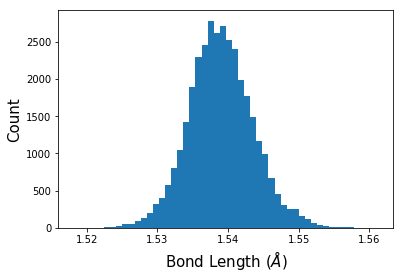

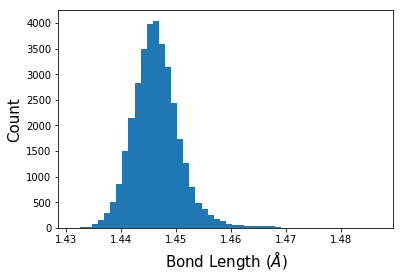

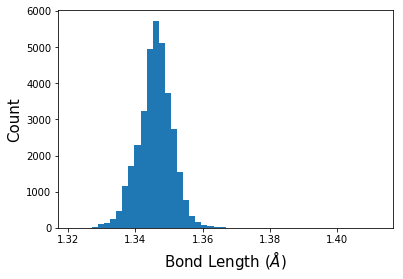

In [88]:
plt.hist(q.iloc[:,0],bins=50)
plt.xlabel(r"Bond Length ($\AA$)",size=15)
plt.ylabel("Count",size=15)
plt.savefig("peptide_bondlength_CC.pdf",dpi=150,bbox_inches="tight")
plt.show()
plt.hist(q.iloc[:,1],bins=50)
plt.xlabel(r"Bond Length ($\AA$)",size=15)
plt.ylabel("Count",size=15)
plt.savefig("peptide_bondlength_CN.pdf",dpi=150,bbox_inches="tight")
plt.show()
plt.hist(q.iloc[:,2],bins=50)
plt.xlabel(r"Bond Length ($\AA$)",size=15)
plt.ylabel("Count",size=15)
plt.savefig("peptide_bondlength_NC.pdf",dpi=150,bbox_inches="tight")
plt.show()

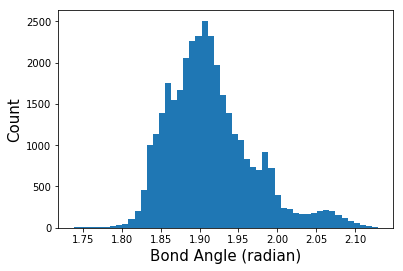

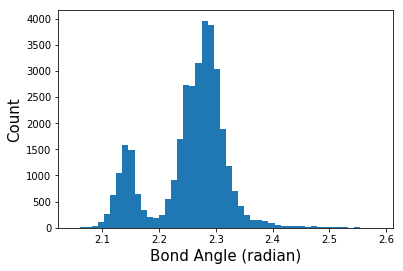

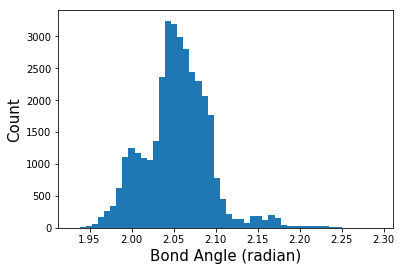

In [103]:
plt.hist(bondang_frame.iloc[:,0],bins=50)
plt.xlabel(r"Bond Angle (radian)",size=15)
plt.ylabel("Count",size=15)
plt.savefig("peptide_bondangle_A.pdf",dpi=150,bbox_inches="tight")
plt.show()
plt.hist(bondang_frame.iloc[:,1],bins=50)
plt.xlabel(r"Bond Angle (radian)",size=15)
plt.ylabel("Count",size=15)
plt.savefig("peptide_bondangle_B.pdf",dpi=150,bbox_inches="tight")
plt.show()
plt.hist(bondang_frame.iloc[:,2],bins=50)
plt.xlabel(r"Bond Angle (radian)",size=15)
plt.ylabel("Count",size=15)
plt.savefig("peptide_bondangle_C.pdf",dpi=150,bbox_inches="tight")
plt.show()

In [32]:
GetAminoAcidType(ctps[0], 7)

'C'

In [34]:
CTPOrder(ctps[0], [5,7,8,9,11,12,13,15,16,17,3,4] )

[13, 15, 16, 17, 3, 4, 5, 7, 8, 9, 11, 12]

In [12]:
ctps[0].GetSubstructMatches(ctps_backbone2)

((5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 3, 4),)

In [24]:
eccentricity = []
for mol in ctps:
    matches = mol.GetSubstructMatches(ctps_backbone2)
    eccentricity.append(RA.GetEccentricity(mol,[matches[0][x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]]))

In [27]:
a = pd.DataFrame(eccentricity)

In [29]:
a.to_csv("eccentricity.csv",index=None)

In [52]:
b1 = a[s1.values]
b2 = a[s2.values]
b3 = a[s3.values]

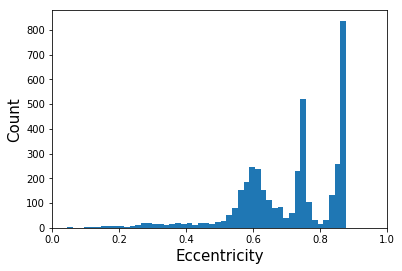

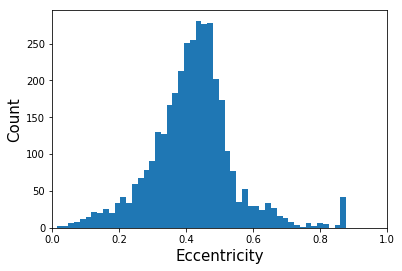

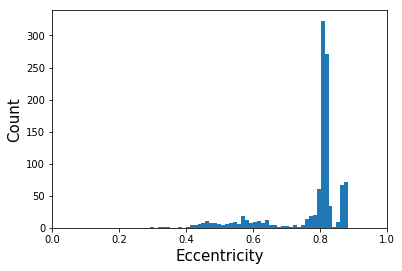

In [61]:
plt.hist(b1.values,bins=50)
plt.xlim(0,1)
plt.xlabel("Eccentricity",size=15)
plt.ylabel("Count",size=15)
plt.show()

plt.hist(b2.values,bins=50)
plt.xlim(0,1)
plt.xlabel("Eccentricity",size=15)
plt.ylabel("Count",size=15)
plt.show()

plt.hist(b3.values,bins=50)
plt.xlim(0,1)
plt.xlabel("Eccentricity",size=15)
plt.ylabel("Count",size=15)
plt.show()

In [30]:
cp = []
orientation = []
aatype = []
for idx, mol in enumerate(ctps):
    matches = mol.GetSubstructMatches(ctps_backbone2)
    #backbone = [matches[0][x] for x in [0,1,2,4,5,6,8,9,10,12,13,14]]
    backbone = RA.Rearrangement(mol, [matches[0][x] for x in [0,2,3,4,6,7,8,10,11,12,14,15]])
    coord = np.array([mol.GetConformer().GetAtomPosition(x) for x in backbone])
    c_coord = RA.Translate(coord)
    cp.append(RA.GetRingPuckerCoords(c_coord))
    orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (0,1)))
    orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (4,5)))
    orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (8,9)))
    orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (12,13)))
    aatype.append(GetAminoAcidType(mol,backbone[1]))
    aatype.append(GetAminoAcidType(mol,backbone[4]))
    aatype.append(GetAminoAcidType(mol,backbone[7]))
    aatype.append(GetAminoAcidType(mol,backbone[10]))
    #orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (2,3)))
    #orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (6,7)))
    #orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (10,11)))
    #orientation.append(RA.GetRingSubstituentPosition(mol, backbone, (14,15)))
    #aatype.append(GetAminoAcidType(mol,1))
    #aatype.append(GetAminoAcidType(mol,5))
    #aatype.append(GetAminoAcidType(mol,9))
    #aatype.append(GetAminoAcidType(mol,13))

In [41]:
a1 = pd.DataFrame(np.array([item[0] for item in orientation]).reshape([8661,4]),columns=["a1","a2","a3","a4"])
a2 = pd.DataFrame([item[1] for item in cp],columns=["phi2","phi3","phi4","phi5"])
a3 = pd.DataFrame([item[0] for item in cp],columns=["q2","q3","q4","q5","q6"])

In [49]:
aaa = pd.concat([a2,a3,a1],axis=1)

In [235]:
bb1 = aaa[np.abs(aaa["phi4"]+1.63)<0.04]
bb2 = aaa[np.abs(aaa["phi4"]+1.9)<0.15]
bb3 = aaa[np.abs(aaa["phi4"]+2.2)<0.15]

In [236]:
bb1a =  bb1[np.abs(bb1["phi2"]+0.4)<0.3]
bb1b =  bb1[np.abs(bb1["phi2"]+0.4-np.pi)<0.3]

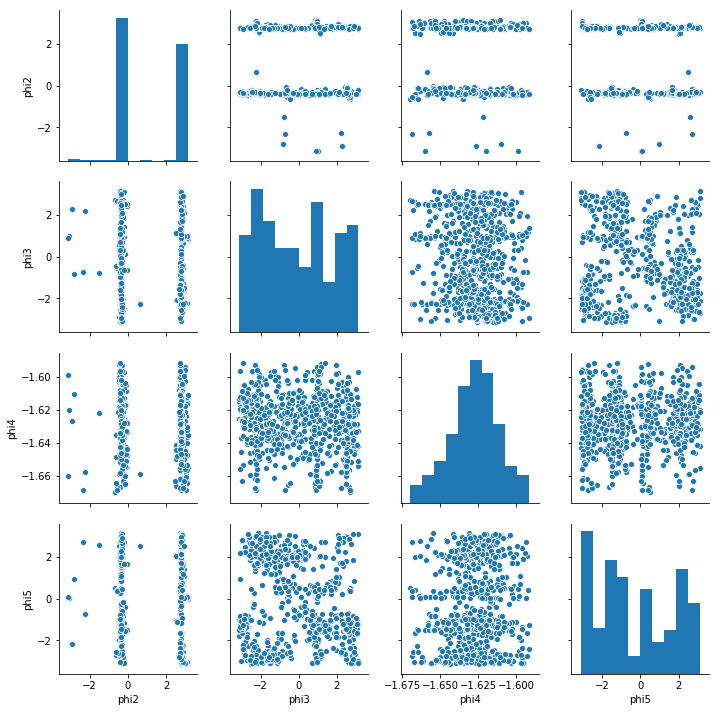

In [237]:
sns.pairplot(bb1.iloc[:,:4])

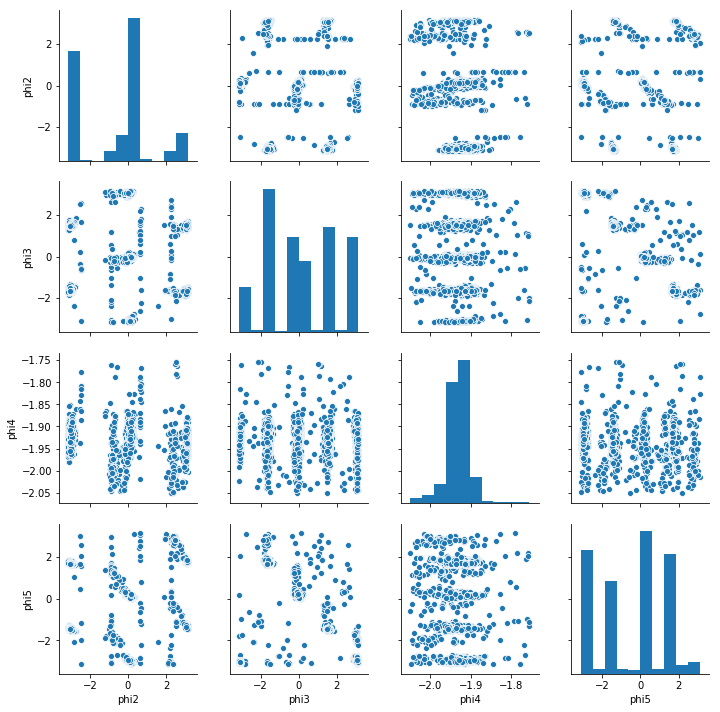

In [191]:
sns.pairplot(bb2.iloc[:,:4])

(array([583., 549.,  57.,   1.,   1.,   8.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   3.,   0.,  26.,  38.,  34.,  10.,   5.,
          8.,  41., 215., 896., 608.,  45.,   0.,   3.,  15.,   0.,   0.,
          0.,   0.,   0.,   0.,   1.,   0.,   0.,   3.,   3.,  26.,  29.,
         46.,  12.,   3.,   8.,  40., 238.]),
 array([-3.14157995e+00, -3.01591671e+00, -2.89025346e+00, -2.76459022e+00,
        -2.63892698e+00, -2.51326373e+00, -2.38760049e+00, -2.26193725e+00,
        -2.13627401e+00, -2.01061076e+00, -1.88494752e+00, -1.75928428e+00,
        -1.63362104e+00, -1.50795779e+00, -1.38229455e+00, -1.25663131e+00,
        -1.13096807e+00, -1.00530482e+00, -8.79641580e-01, -7.53978338e-01,
        -6.28315095e-01, -5.02651852e-01, -3.76988610e-01, -2.51325367e-01,
        -1.25662124e-01,  1.11829585e-06,  1.25664361e-01,  2.51327604e-01,
         3.76990846e-01,  5.02654089e-01,  6.28317332e-01,  7.53980574e-01,
         8.79643817e-01,  1.00530706e+00,  1.13097

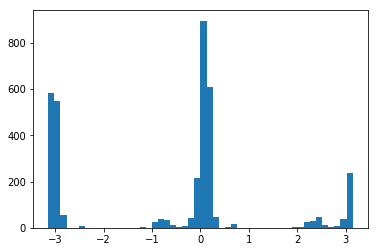

In [210]:
plt.hist(bb2["phi2"],bins=50)

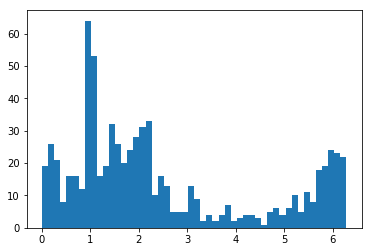

In [242]:
plt.hist(np.mod(bb1["phi3"]+bb1["phi5"],2*np.pi),bins=50)
plt.show()

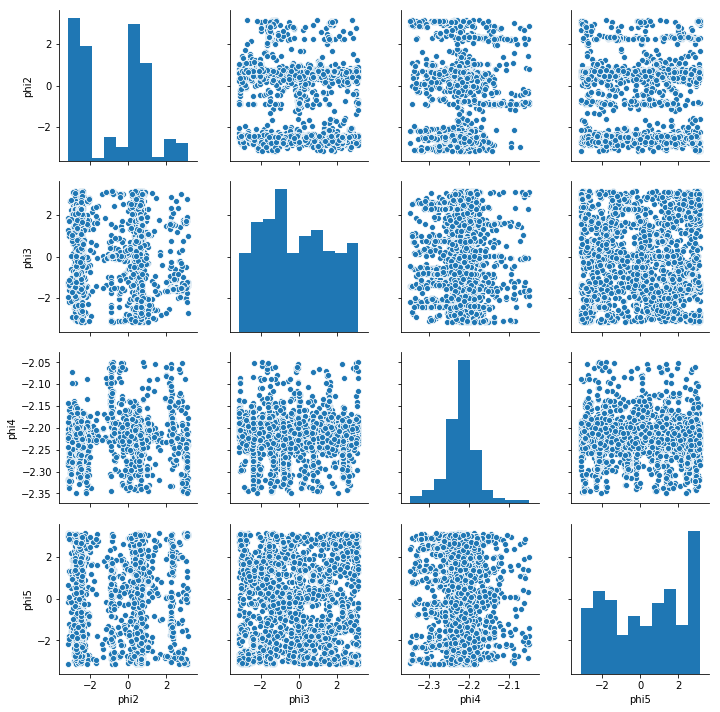

In [192]:
sns.pairplot(bb3.iloc[:,:4])

(array([ 76.,  85.,  78.,  81.,  68.,  47.,  60.,  59.,  49.,  63.,  44.,
         58., 145., 376., 438., 182.,  38.,  28.,  20.,  22.,  20.,  21.,
         15.,  18.,  20.,  18.,  22.,  30.,  32.,  23.,  29.,  31.,  35.,
         50.,  58.,  63.,  57.,  68.,  79.,  83.,  84.,  69.,  83., 165.,
         94.,  96.,  84.,  97., 107.,  87.]),
 array([9.23812469e-04, 1.26495058e-01, 2.52066304e-01, 3.77637550e-01,
        5.03208796e-01, 6.28780042e-01, 7.54351288e-01, 8.79922534e-01,
        1.00549378e+00, 1.13106503e+00, 1.25663627e+00, 1.38220752e+00,
        1.50777876e+00, 1.63335001e+00, 1.75892126e+00, 1.88449250e+00,
        2.01006375e+00, 2.13563499e+00, 2.26120624e+00, 2.38677749e+00,
        2.51234873e+00, 2.63791998e+00, 2.76349122e+00, 2.88906247e+00,
        3.01463372e+00, 3.14020496e+00, 3.26577621e+00, 3.39134745e+00,
        3.51691870e+00, 3.64248995e+00, 3.76806119e+00, 3.89363244e+00,
        4.01920368e+00, 4.14477493e+00, 4.27034618e+00, 4.39591742e+00,
        4.

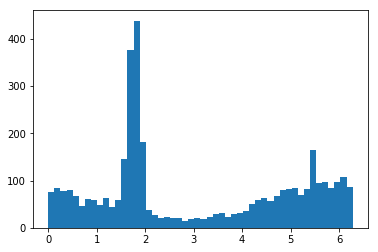

In [244]:
plt.hist(np.mod(bb3["phi3"]+bb3["phi5"],2*np.pi),bins=50)

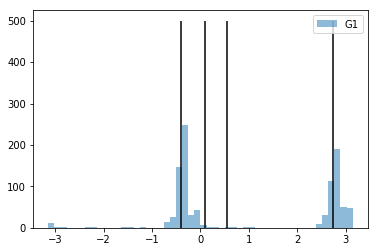

In [182]:
plt.hist(bb1["phi2"],bins=50,alpha=.5,label="G1")
#plt.hist(bb2["phi2"],bins=50,alpha=.5,label="G2")
#plt.hist(bb3["phi2"],bins=50,alpha=.5,label="G3")
plt.vlines(0.1,0,500)
plt.vlines(0.55,0,500)
plt.vlines(-0.4,0,500)
plt.vlines(-0.4+np.pi,0,500)
plt.legend()
plt.show()


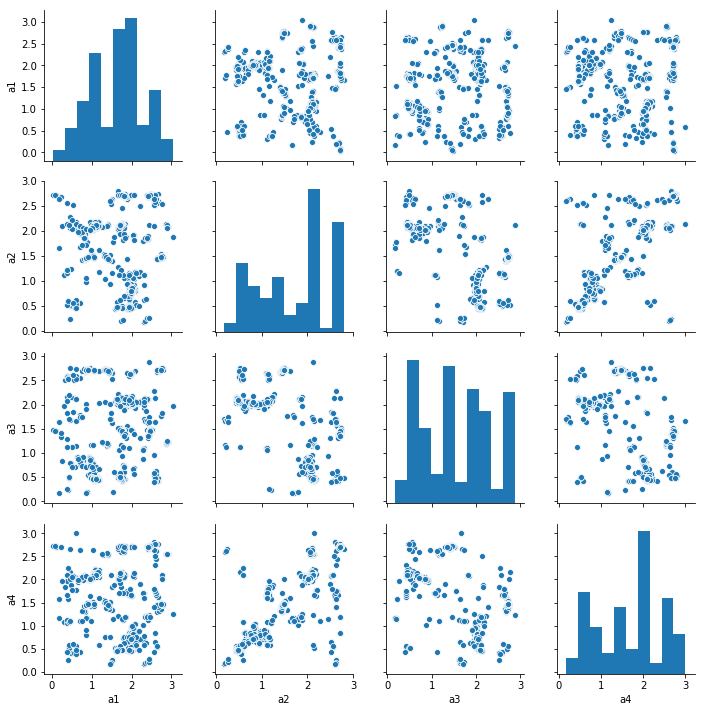

In [114]:
sns.pairplot(bb.iloc[:,9:])

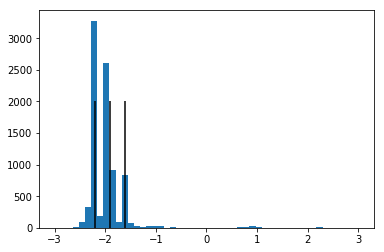

In [131]:
plt.hist(aaa["phi4"],bins=50)
plt.vlines(-1.6,0,2000)
plt.vlines(-1.9,0,2000)
plt.vlines(-2.2,0,2000)
plt.show()

In [96]:
len(bb)

8661

In [97]:
(aaa["phi4"]<np.deg2rad(90)-np.pi)

0        True
1        True
2        True
3        True
4        True
5        True
6        True
7        True
8        True
9        True
10       True
11       True
12       True
13       True
14       True
15       True
16       True
17       True
18       True
19       True
20       True
21       True
22       True
23       True
24       True
25       True
26       True
27       True
28       True
29       True
        ...  
8631     True
8632     True
8633     True
8634     True
8635     True
8636    False
8637     True
8638     True
8639     True
8640     True
8641     True
8642     True
8643     True
8644     True
8645     True
8646     True
8647     True
8648     True
8649     True
8650     True
8651     True
8652     True
8653     True
8654     True
8655     True
8656     True
8657     True
8658    False
8659     True
8660     True
Name: phi4, Length: 8661, dtype: bool

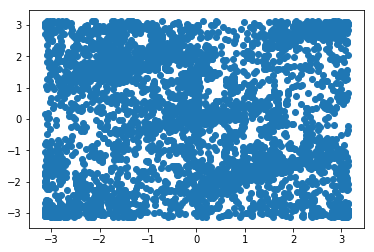

In [98]:
plt.scatter(bb["phi3"],bb["phi5"])

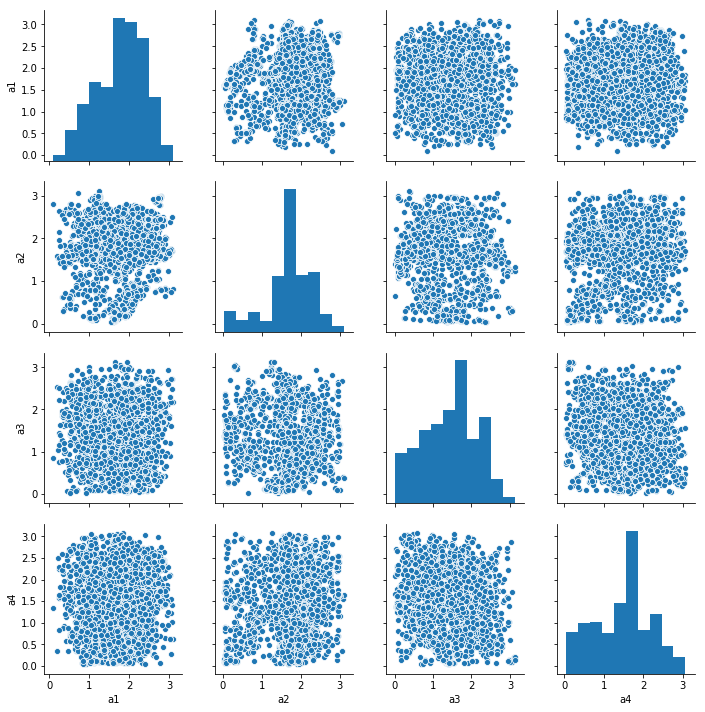

In [72]:
sns.pairplot(bb.iloc[:,9:])

(array([ 78.,  50.,  77., 107., 109., 127.,  80.,  87.,  93., 124.,  94.,
         96.,  80.,  92.,  68.,  62.,  53.,  78., 115.,  60.,  60.,  43.,
         75.,  68.,  69.,  53.,  43.,  41.,  77.,  79.,  53.,  41.,  40.,
         28.,  30.,  37.,  38.,  32.,  59.,  91.,  62.,  78.,  60.,  60.,
         55.,  76.,  68.,  64., 136.,  86.]),
 array([4.32573810e-04, 6.32106261e-02, 1.25988678e-01, 1.88766731e-01,
        2.51544783e-01, 3.14322835e-01, 3.77100888e-01, 4.39878940e-01,
        5.02656992e-01, 5.65435044e-01, 6.28213097e-01, 6.90991149e-01,
        7.53769201e-01, 8.16547253e-01, 8.79325306e-01, 9.42103358e-01,
        1.00488141e+00, 1.06765946e+00, 1.13043751e+00, 1.19321557e+00,
        1.25599362e+00, 1.31877167e+00, 1.38154972e+00, 1.44432778e+00,
        1.50710583e+00, 1.56988388e+00, 1.63266193e+00, 1.69543999e+00,
        1.75821804e+00, 1.82099609e+00, 1.88377414e+00, 1.94655219e+00,
        2.00933025e+00, 2.07210830e+00, 2.13488635e+00, 2.19766440e+00,
        2.

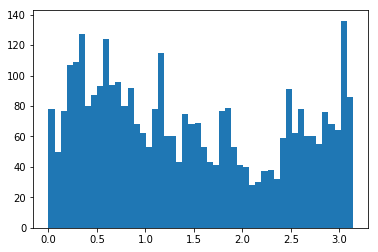

In [81]:
plt.hist(np.mod(bb.iloc[:,9]-bb.iloc[:,11],np.pi),bins=50)

(array([ 73.,  73.,  62.,  70.,  60.,  44.,  58.,  50.,  37.,  42.,  27.,
         40., 128., 366., 424., 141.,  37.,  22.,  18.,  20.,  20.,  17.,
         14.,  16.,  20.,  17.,  23.,  30.,  34.,  34.,  49.,  36.,  41.,
         52.,  62.,  63.,  57.,  67.,  78.,  82.,  78.,  69.,  82., 166.,
         91.,  91.,  81.,  90.,  99.,  81.]),
 array([9.23812469e-04, 1.26495058e-01, 2.52066304e-01, 3.77637550e-01,
        5.03208796e-01, 6.28780042e-01, 7.54351288e-01, 8.79922534e-01,
        1.00549378e+00, 1.13106503e+00, 1.25663627e+00, 1.38220752e+00,
        1.50777876e+00, 1.63335001e+00, 1.75892126e+00, 1.88449250e+00,
        2.01006375e+00, 2.13563499e+00, 2.26120624e+00, 2.38677749e+00,
        2.51234873e+00, 2.63791998e+00, 2.76349122e+00, 2.88906247e+00,
        3.01463372e+00, 3.14020496e+00, 3.26577621e+00, 3.39134745e+00,
        3.51691870e+00, 3.64248995e+00, 3.76806119e+00, 3.89363244e+00,
        4.01920368e+00, 4.14477493e+00, 4.27034618e+00, 4.39591742e+00,
        4.

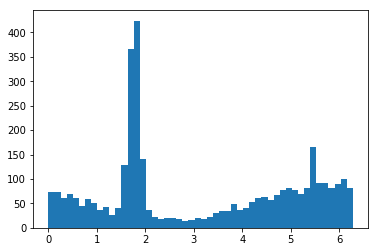

In [70]:
plt.hist(np.mod(bb["phi3"]+bb["phi5"],2*np.pi),bins=50)

In [44]:
t = pd.DataFrame(np.array([item[0] for item in orientation]).reshape([8661,4]))

In [45]:
col2 = pd.DataFrame([item[1] for item in cp]).iloc[:,2]

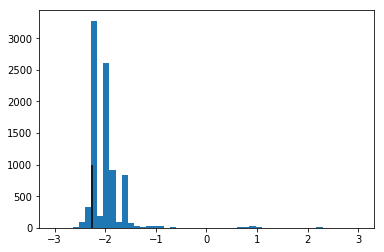

In [48]:
plt.hist(col2,bins=50)
plt.vlines(np.deg2rad(50)-np.pi,0,1000)

In [62]:
np.deg2rad(50)-np.pi

-2.2689280275926285

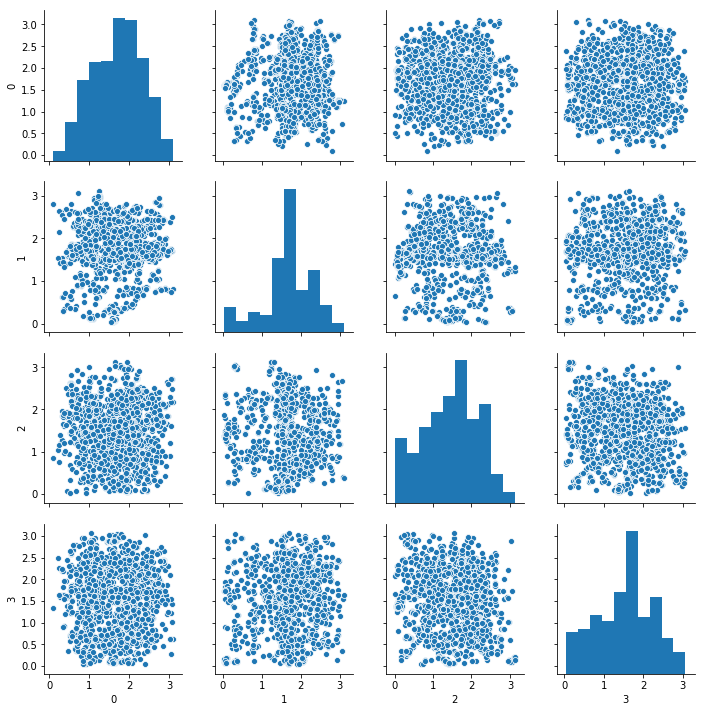

In [63]:
sns.pairplot(t[col2<-2.23])

In [106]:
aaframe = np.array(aatype).reshape([8661,4]).tolist()

In [107]:
selook = Chem.SDWriter("s3.sdf")
for idx in tt:
    selook.write(ctps[idx])
selook.close()

NameError: name 'tt' is not defined

In [108]:
tt = np.argwhere(s3).reshape((sum(s3))).tolist()

NameError: name 's3' is not defined

In [109]:
print(orientations[s3].iloc[119,:])
print(pd.DataFrame(aaframe).iloc[tt,:].iloc[119,:])

NameError: name 'orientations' is not defined

In [110]:
oo = [item[0] for item in orientation]
dd = pd.DataFrame({"A":oo,"B":aatype})

In [138]:
tmp = np.array(aatype).reshape([8661,4])

In [105]:
a1 = pd.DataFrame(np.array(oo).reshape([8661,4]))[s1]
a2 = pd.DataFrame(np.array(oo).reshape([8661,4]))[s2]
a3 = pd.DataFrame(np.array(oo).reshape([8661,4]))[s3]
b1 = pd.DataFrame(tmp)[s1]
b2 = pd.DataFrame(tmp)[s2]
b3 = pd.DataFrame(tmp)[s3]

NameError: name 'oo' is not defined

In [148]:
a11 = a1.values.reshape([len(a1)*4])
b11 = b1.values.reshape(len(a1)*4)

(array([ 33.,  23.,  33.,  33.,  28.,  27.,  34.,  34.,  21.,  29.,  84.,
         81.,  38.,  31.,  31.,  28.,  37.,  53.,  48.,  27.,  26.,  63.,
         43.,  49.,  52., 134., 127., 150.,  70., 109., 120.,  68.,  37.,
         58.,  63.,  39.,  42.,  75.,  74.,  85.,  67.,  38.,  35.,  24.,
         52.,  13.,  17.,   4.,   4.,   2.]),
 array([0.06633756, 0.1259132 , 0.18548883, 0.24506447, 0.30464011,
        0.36421574, 0.42379138, 0.48336701, 0.54294265, 0.60251829,
        0.66209392, 0.72166956, 0.78124519, 0.84082083, 0.90039647,
        0.9599721 , 1.01954774, 1.07912337, 1.13869901, 1.19827465,
        1.25785028, 1.31742592, 1.37700155, 1.43657719, 1.49615283,
        1.55572846, 1.6153041 , 1.67487973, 1.73445537, 1.79403101,
        1.85360664, 1.91318228, 1.97275791, 2.03233355, 2.09190919,
        2.15148482, 2.21106046, 2.27063609, 2.33021173, 2.38978737,
        2.449363  , 2.50893864, 2.56851427, 2.62808991, 2.68766555,
        2.74724118, 2.80681682, 2.86639245, 2.

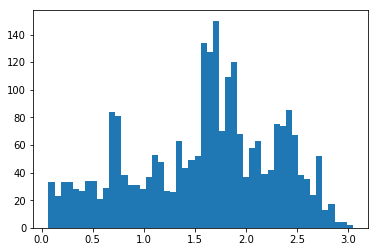

In [129]:
plt.hist(dd.groupby("B").get_group("S")["A"],bins=50)

0: A,S,G,E   (A,G)
1: C,V,G,E  (V,E) 
#3: E,Y,C,G   (Y,G)
4: L,Y,D,Y   (Y,Y)
#5: C,E,G,W   (C,G)
6: E,W,C,S   (E,C)
7: D,C,Y,Y   (D,Y)
8: Y,S,S,E   (Y,S)
9: V,E,E,V   (E,V)
11: E,C,C,C  (C,C)
#13: E,E,V,L  (E,V)
15: L,E,E,C  (L,E)
16: L,C,C,E  (L,C)
18: D,S,Y,Y  (D,Y)
19: A,Y,S,E  (Y,E)
20: L,E,S,E  (L,S)
21: A,S,E,T  (S,T)
22: S,E,G,Y   (E,Y)
23: T,E,H,C    (T,H)
24: E,S,C,S   (E,C)
25: T,C,E,Y  (T,E)
26: L,E,E,L  (L,E)
27: E,E,F,Y (E,F)
29: E,H,F,C  (H,C)
70: A,A,D,S  (A,S)
71: V,D,W,D (W,V)
72: L,T,D,T (T,T)
75: L,D,F,D (D,D)
84: D,Y,C,T, (Y,T)
101: E,F,D,G  (F,G)
104: L,V,D,W (L,D)
108: T,D,C,E (T,C)
118: A,D,F,S (A,F)
119: V,D,C,C (V,C)

In [31]:
Chem.MolToSmiles(ctps[1])

'CC(C)C[C@@H]1NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H]([C@@H](C)O)NC1=O'

In [32]:
amplitude = [item[0] for item in cp]
angle = pd.DataFrame([item[1] for item in cp])
orientations = pd.DataFrame(np.array([item[0] for item in orientation]).reshape((8661,4)))

In [33]:
s = angle.iloc[:,2]
s1 = (s<(np.deg2rad(65)-np.pi)) 
s2 = (s<(np.deg2rad(85)-np.pi)) & (s>(np.deg2rad(65)-np.pi))
s3 = s>(np.deg2rad(85)-np.pi)

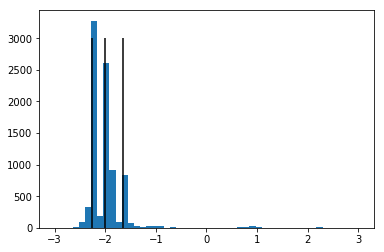

In [114]:
plt.hist(angle.iloc[:,2],bins=50)
plt.vlines(-np.pi+np.deg2rad(50),0,3000)
plt.vlines(-np.pi+np.deg2rad(65),0,3000)
plt.vlines(-np.pi+np.deg2rad(85),0,3000)

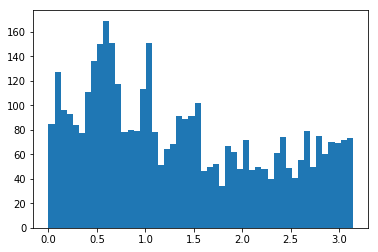

In [130]:
plt.hist(np.mod(group1.iloc[:,0]-group1.iloc[:,3],np.pi),bins=50)
plt.show()

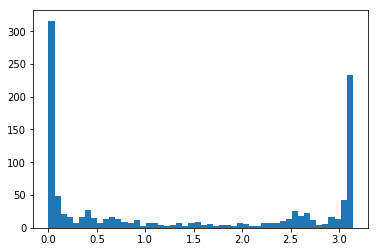

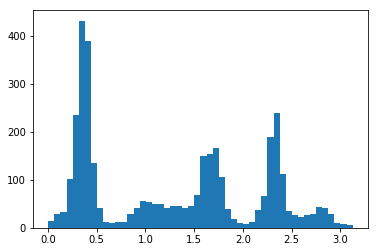

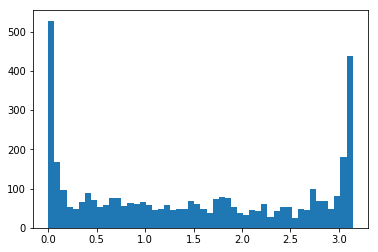

In [124]:
plt.hist(np.mod(group3.iloc[:,1]-group3.iloc[:,3],np.pi),bins=50)
plt.show()

plt.hist(np.mod(group2.iloc[:,1]+group2.iloc[:,3],np.pi),bins=50)
plt.show()

plt.hist(np.mod(group1.iloc[:,1]-group1.iloc[:,3],np.pi),bins=50)
plt.show()

In [116]:
group1 = orientations[s1]
group2 = orientations[s2]
group3 = orientations[s3]

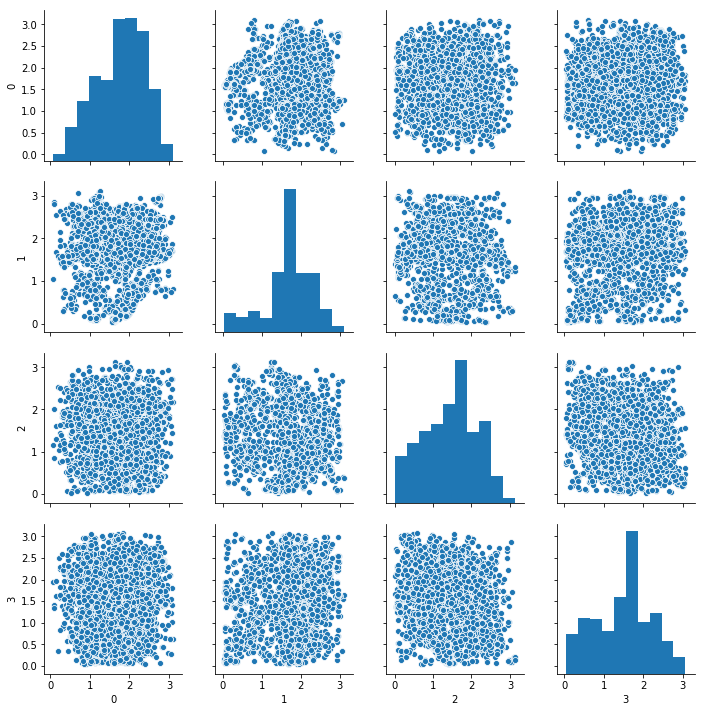

In [125]:
sns.pairplot(group1)

In [32]:
amplitude = [item[0] for item in cp]
angle = pd.DataFrame([item[1] for item in cp])
orientations = pd.DataFrame(np.array([item[0] for item in orientation]).reshape((8661,4)))

In [38]:
s = angle.iloc[:,2]
s1 = (s<np.deg2rad(40)) & (s>np.deg2rad(20))
s2 = (s<np.deg2rad(60)) & (s>np.deg2rad(40))
s3 = s>np.deg2rad(60)

In [39]:
group1 = orientations[s1]
group2 = orientations[s2]
group3 = orientations[s3]

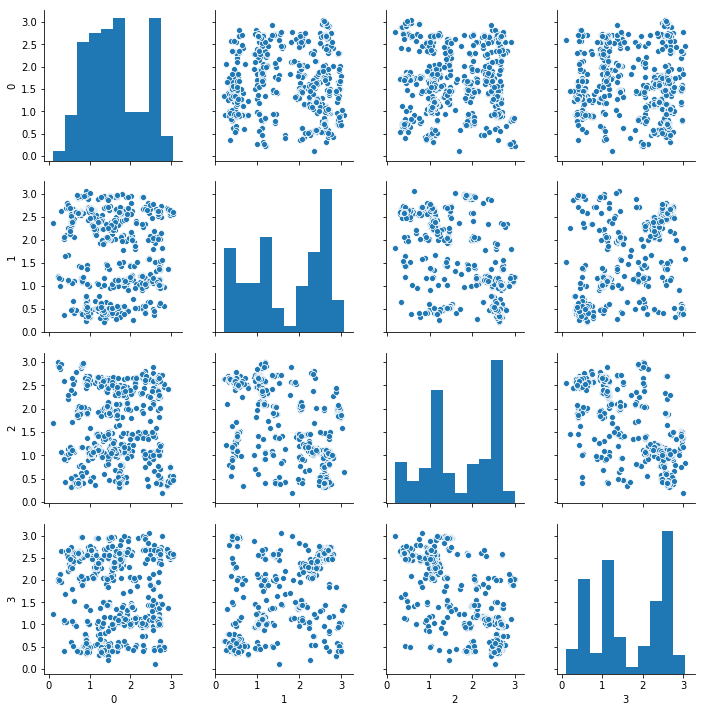

In [40]:
sns.pairplot(group1)

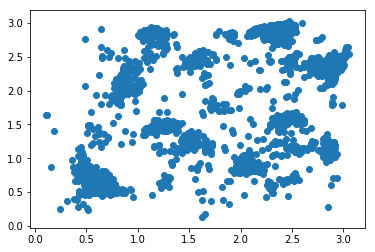

In [57]:
plt.scatter(group2.iloc[:,1],group2.iloc[:,3])

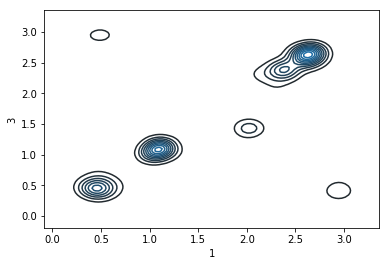

In [62]:
sns.kdeplot(group1.iloc[:,1],group1.iloc[:,3],bw=0.1)

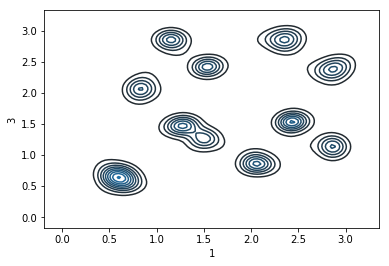

In [59]:
sns.kdeplot(group2.iloc[:,1],group2.iloc[:,3],bw=0.1)

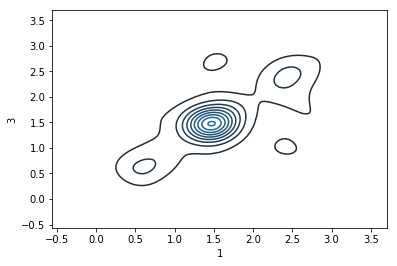

In [67]:
sns.kdeplot(group3.iloc[:,1],group3.iloc[:,3],bw=0.2)

In [71]:
group3

,0,1,2,3
1,1.746533,1.102246,0.820772,0.621592
5,1.800935,2.511378,2.211247,2.590581
7,0.798357,1.444138,0.522890,1.314705
8,0.229396,1.440890,0.517469,1.420236
10,2.205923,2.985384,1.448395,1.561922
11,0.607366,2.360958,2.435123,2.218113
12,0.195132,1.362236,0.528839,1.326363
13,1.465118,1.476012,1.477632,1.588812
14,0.259515,1.049668,0.688734,1.134628
18,1.599228,1.671429,2.052178,0.890935


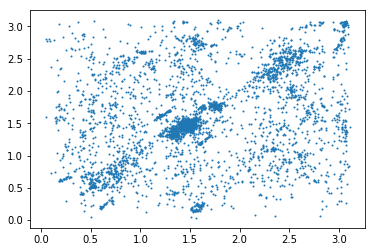

In [65]:
plt.scatter(group3.iloc[:,1],group3.iloc[:,3],s=1)

In [46]:
len(group3)

3860

In [58]:
orientations = np.array(orientation)[:,0].reshape((8661,4))

In [59]:
frame = pd.DataFrame(orientations)

In [73]:
a = frame.iloc[:,[1,3]].values

/home/lucian/anaconda3/envs/Chem/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


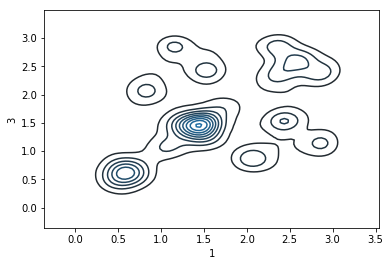

In [75]:
sns.kdeplot(frame.iloc[:,1],frame.iloc[:,3])

In [9]:
qqq = pd.DataFrame([item[1] for item in cp])

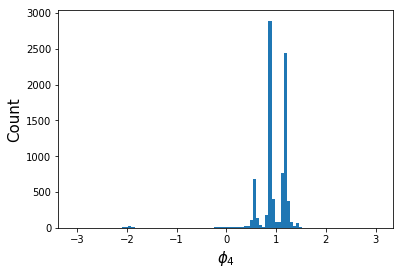

In [36]:
plt.hist(qqq[2],bins=100)
plt.xlabel(r"$\phi_{4}$",size=15)
plt.ylabel("Count",size=15)
plt.savefig("peptide_phi4.pdf",dpi=150,bbox_inches="tight")
plt.show()

In [30]:
np.deg2rad(70)

1.2217304763960306

In [32]:
qqq[np.abs(qqq[2]-1.22)<0.02]

,0,1,2,3
24,-2.817942,-0.478637,1.203544,-0.114078
53,-1.842593,-1.777223,1.209877,-2.077833
54,-2.817425,-2.427619,1.223446,-1.477538
115,0.873283,0.545052,1.239902,-1.872107
163,0.815157,0.542587,1.231430,-1.872812
208,1.094265,-0.294560,1.230759,2.779041
224,-2.368736,0.907064,1.200021,1.449901
264,1.204201,2.968058,1.221426,-0.643908
298,1.331376,-0.064921,1.216559,2.418624
389,-2.801798,-2.420253,1.202979,-1.535887


In [132]:
u = GetURFs(mol[0])

In [134]:
RA.GetRingSubstituentPosition(mol[0], [1, 3, 5, 7, 9, 0], [1,2])

(3.019206574718576, 0.039801133260334326)

In [141]:
RA.GetRingSubstituentPosition(mol[0], [3, 5, 7, 9, 0, 1], [7,8])

(1.9367330193461767, 0.0959533667739643)

In [140]:
RA.GetRingSubstituentPosition(mol[0], [9,7,5,3,1,0], [7,8])

(1.2048596342436166, -0.09595336677396409)

In [142]:
t = a.iloc[q.index,:][[1,3,5,7]]

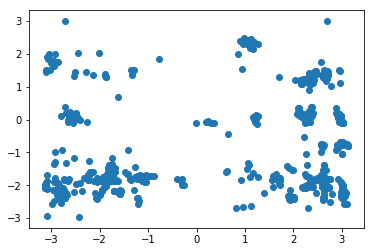

In [144]:
plt.scatter(t[7],t[5])

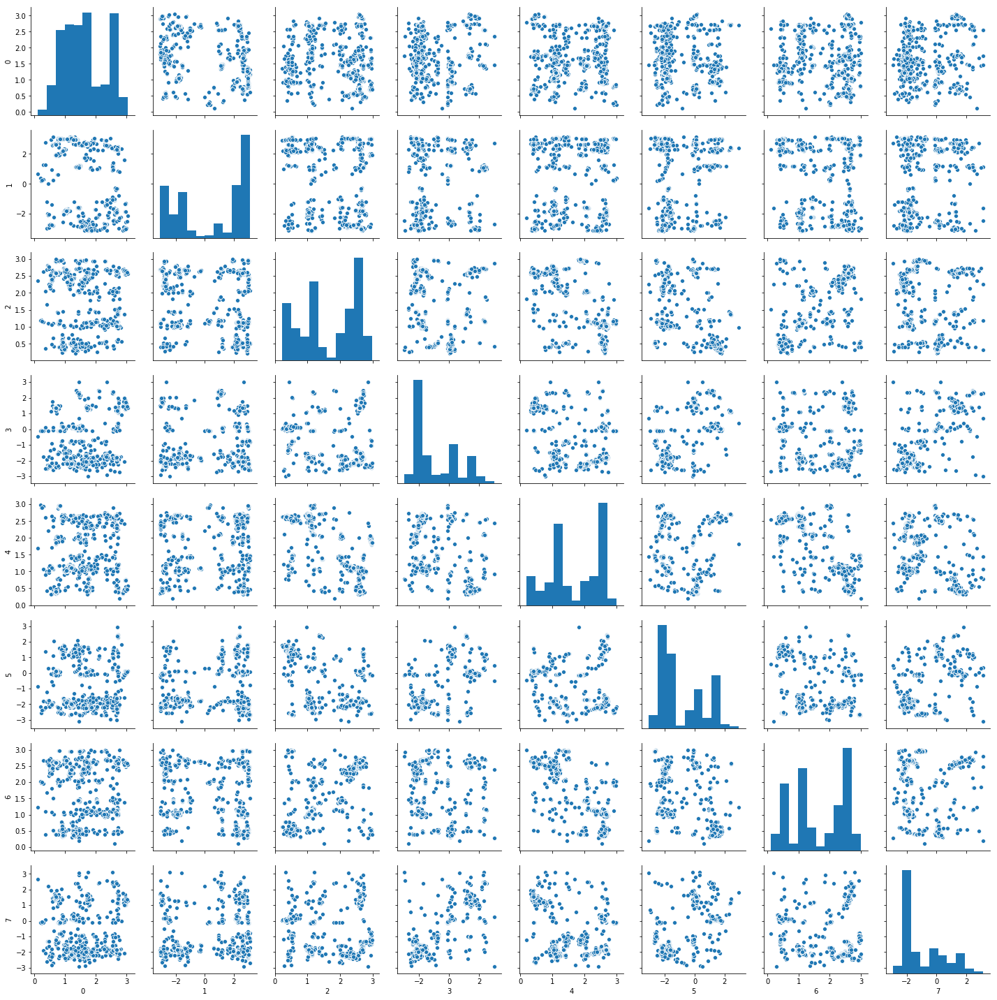

In [118]:
sns.pairplot(a.iloc[q.index,:])

In [105]:
a = pd.DataFrame(np.array(orientation).reshape((8661,8)))

In [82]:
b = pd.DataFrame([item[1] for item in cp])

In [96]:
np.deg2rad(30)

0.5235987755982988

In [117]:
q = b[(b[2]<0.65) & (b[2]>0.45)]

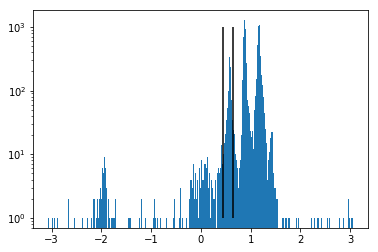

In [116]:
plt.hist(b[2],bins=300)
plt.yscale("log")
plt.vlines(0.65,1000,1)
plt.vlines(0.45,1000,1)
plt.show()


(array([  19.,   60.,  148.,  242.,  234.,  246.,  525.,  733., 1049.,
         817.,  889.,  843.,  872.,  996.,  710.,  605.,  779., 1006.,
         903.,  907., 1016.,  971., 1347., 2009., 2172.,  813.,  495.,
         566.,  534.,  434.,  400.,  499.,  709.,  519.,  498.,  512.,
         665.,  975., 1349.,  772.,  586.,  708.,  651.,  428.,  427.,
         829.,  472.,  297.,  325.,   83.]),
 array([0.01086007, 0.0733511 , 0.13584213, 0.19833316, 0.26082419,
        0.32331523, 0.38580626, 0.44829729, 0.51078832, 0.57327935,
        0.63577039, 0.69826142, 0.76075245, 0.82324348, 0.88573451,
        0.94822555, 1.01071658, 1.07320761, 1.13569864, 1.19818967,
        1.26068071, 1.32317174, 1.38566277, 1.4481538 , 1.51064483,
        1.57313587, 1.6356269 , 1.69811793, 1.76060896, 1.82309999,
        1.88559103, 1.94808206, 2.01057309, 2.07306412, 2.13555515,
        2.19804619, 2.26053722, 2.32302825, 2.38551928, 2.44801032,
        2.51050135, 2.57299238, 2.63548341, 2.69797444, 

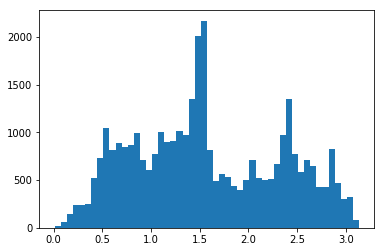

In [63]:
plt.hist(pd.DataFrame(orientation)[0],bins=50)

In [68]:
a = pd.DataFrame(orientation)

In [76]:
cp1 = []
orientation1 = []
aatype1 = []
for mol in Chem.SDMolSupplier("../peptide/see.sdf"):
    matches = mol.GetSubstructMatches(ctps_backbone)
    backbone = [matches[0][x] for x in [0,1,2,4,5,6,8,9,10,12,13,14]]
    coord = np.array([mol.GetConformer().GetAtomPosition(x) for x in backbone])
    c_coord = RA.Translate(coord)
    cp1.append(RA.GetRingPuckerCoords(c_coord))
    orientation1.append(RA.GetRingSubstituentPosition(mol, backbone, (2,3)))
    orientation1.append(RA.GetRingSubstituentPosition(mol, backbone, (6,7)))
    orientation1.append(RA.GetRingSubstituentPosition(mol, backbone, (10,11)))
    orientation1.append(RA.GetRingSubstituentPosition(mol, backbone, (14,15)))
    #aatype.append(GetAminoAcidType(mol,1))

[(1.5657135508064512, 2.718954513820832),
 (2.8512694611623113, 1.476404431570339),
 (0.5696800890966394, -0.8951103429269165),
 (1.1759044184891916, -0.30195602565643676),
 (1.9595349472284767, 3.138371014161981),
 (1.9087556534589536, -2.7859354562942693),
 (2.8968422272271517, -1.6030848726842697),
 (1.8910402426413293, -2.7913469614152926),
 (1.4498702377464754, -1.6060509288853584),
 (1.829577960266189, -1.5029111566930138),
 (1.1840269997570574, -0.8967410404630072),
 (2.963162100430844, 1.3047297602082435)]

In [16]:
bonds = []
for bond in mol.GetBonds():
    bonds.append((bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()))
data = py_rdl.Calculator.get_calculated_result(bonds)
for urf in data.urfs:
    rcs = data.get_relevant_cycles_for_urf(urf)
    for rc in rcs:
            

KeyboardInterrupt: 

In [404]:
# Side Chain Distribution
ala = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(alanine)
    if any(match):
        for item in match:
            ala.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))  

phen = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(phenylalanine)
    if any(match):
        for item in match:
            phen.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

tyro = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(tyrosin)
    if any(match):
        for item in match:
            tyro.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

tryp = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(tryptophan)
    if any(match):
        for item in match:
            tryp.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

leu = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(leucine)
    if any(match):
        for item in match:
            leu.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))   
            
val = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(valine)
    if any(match):
        for item in match:
            val.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))       
    
hist = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(histidine)
    if any(match):
        for item in match:
            hist.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

cys = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(cysteine)
    if any(match):
        for item in match:
            cys.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

            
            
ly = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(lysine)
    if any(match):
        for item in match:
            ly.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              
            
    
asp = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(aspartic_acid)
    if any(match):
        for item in match:
            asp.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              

            
glu = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(glutamic_acid)
    if any(match):
        for item in match:
            glu.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))              
            
ser = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(serine)
    if any(match):
        for item in match:
            ser.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))  
    
            
thre = []
for mol in cyclic_peptide:
    match = mol.GetSubstructMatches(threonine)
    if any(match):
        for item in match:
            thre.append(rdMolTransforms.GetDihedralRad(mol.GetConformer(), item[2],item[1], item[-3], item[-1]))  

In [626]:
def PeptideOrder(mol, ring):
    path = list(ring)
    cys_match = mol.GetSubstructMatches(cysteine)
    tyr_match = mol.GetSubstructMatches(tyrosin)
    tryp_match = mol.GetSubstructMatches(tryptophan)
    phe_match = mol.GetSubstructMatches(phenylalanine)
    check = [any(cys_match),any(tyr_match),any(tryp_match),any(phe_match)]
    matches = [cys_match, tyr_match, tryp_match, phe_match]
    loc = []
    if any(check):
        idx = [i for i,j in enumerate(check) if j]
        if len(idx)>1:
            for i in idx:
                for item in matches[i]:
                    loc.append(path.index(item[-3]))
            minloc = np.min(loc)
            order = [path[x] for x in range(minloc,12)]+[path[x] for x in range(minloc)]
        elif len(idx)==1:
            tmp = matches[idx[0]]
            for item in tmp:
                loc.append(path.index(item[-3]))
            minloc = np.min(loc)
            order = [path[x] for x in range(minloc,12)]+[path[x] for x in range(minloc)]
        else:
            order = ring
    return order

In [554]:
cyclic_peptide = Chem.SDMolSupplier("Peptide/CREST/combine.sdf")

In [619]:
amplitude = []
phase = []
smarts = Chem.MolFromSmarts("C1(=O)CNCCNCCNCCN1")

In [620]:
mol = cyclic_peptide[1]
matches = mol.GetSubstructMatches(smarts)[0]
coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in match]
trans_coords = RING.Translate(np.array(coords)) 
amp, ang = RING.GetRingPuckerCoords(trans_coords)

In [713]:
amplitude1 = []
phase1 = []
amplitude2 = []
phase2 = []
for mol in cyclic_peptide:
    matches = mol.GetSubstructMatches(smarts)[0]
    correct = [matches[x] for x in [0,2,3,4,5,6,7,8,9,10,11,12]]
    gly_match = mol.GetSubstructMatches(glycine)
    # 
    cys_match = mol.GetSubstructMatches(cysteine)
    tyr_match = mol.GetSubstructMatches(tyrosin)
    tryp_match = mol.GetSubstructMatches(tryptophan)
    phe_match = mol.GetSubstructMatches(phenylalanine)
    ####
    hist_match = mol.GetSubstructMatches(histidine)
    glu_match = mol.GetSubstructMatches(glutamic_acid)
    ly_match = mol.GetSubstructMatches(lysine)
    ser_match = mol.GetSubstructMatches(serine)
    ####
    leu_match = mol.GetSubstructMatches(leucine)
    thre_match = mol.GetSubstructMatches(threonine)
    ala_match = mol.GetSubstructMatches(alanine)
    asp_match =  mol.GetSubstructMatches(aspartic_acid)
    val_match =  mol.GetSubstructMatches(valine)
    # len(leu_match)==0 and len(thre_match)==0 and len(ala_match)==0 and len(asp_match)==0 and len(val_match)==0 and len(glu_match)==0 and len(ser_match)==0 and len(ly_match)==0 and len(hist_match)==0:

    if any(cys_match) and len(tyr_match)==0 and len(tryp_match)==0 and len(phe_match)==0 and len(hist_match)==0 and len(leu_match)==0 and len(gly_match)==0:
        #carbon = cys_match[0][-3]
        #idx = correct.index(carbon)
        #match = [correct[x] for x in range(idx,12)]+[correct[x] for x in range(idx)]
        order =PeptideOrder(mol, correct)
        coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in order]
        trans_coords = RING.Translate(np.array(coords)) # center the ring at origin
        amp, ang = RING.GetRingPuckerCoords(trans_coords)
        amplitude1.append(amp)
        phase1.append(ang)
    elif any(phe_match) and len(cys_match)==0:
        carbon = phe_match[0][-3]
        idx = correct.index(carbon)
        match = [correct[x] for x in range(idx,12)]+[correct[x] for x in range(idx)]
        coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in match]
        trans_coords = RING.Translate(np.array(coords)) # center the ring at origin
        amp, ang = RING.GetRingPuckerCoords(trans_coords)
        amplitude2.append(amp)
        phase2.append(ang)
    else:
        continue
    

In [714]:
ampframe1 = pd.DataFrame(amplitude1)
phaseframe1 = pd.DataFrame(phase1)
ampframe2 = pd.DataFrame(amplitude2)
phaseframe2 = pd.DataFrame(phase2)

In [710]:
len(ampframe1)

621

In [686]:
x = np.linspace(-np.pi,np.pi,100)
y1 = x+np.random.uniform(-1.1,1.1,100) 
y2 = -x+np.random.uniform(-1.1,1.1,100) 

In [687]:
join = pd.DataFrame({"x":list(x)+list(x),"y":list(y1)+list(y2)})

(array([20., 21., 14., 10.,  3.,  3.,  5.,  5.,  4.,  9.,  6.,  5.,  5.,
         5.,  5.,  4., 11., 24., 16., 25.]),
 array([0.02599053, 0.33798083, 0.64997112, 0.96196142, 1.27395171,
        1.58594201, 1.8979323 , 2.2099226 , 2.52191289, 2.83390319,
        3.14589348, 3.45788378, 3.76987407, 4.08186437, 4.39385466,
        4.70584496, 5.01783525, 5.32982555, 5.64181585, 5.95380614,
        6.26579644]),
 <a list of 20 Patch objects>)

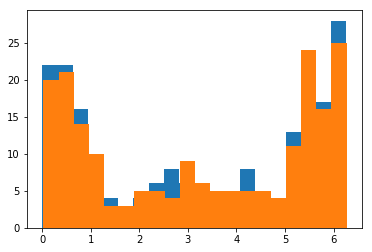

In [689]:
plt.hist(np.mod(join["x"]-join["y"],np.pi*2),bins=20)
plt.hist(np.mod(join["x"]+join["y"],2*np.pi),bins=20)

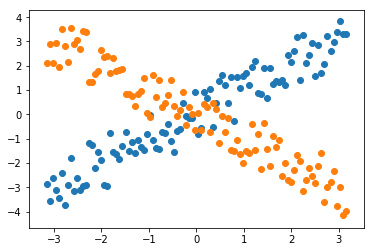

In [690]:
plt.scatter(x,y1)
plt.scatter(x,y2)

(array([270.,  58.,  64.,  29.,  25.,  17.,  15.,  15.,  48.,  80.]),
 array([6.73319655e-04, 6.28453119e-01, 1.25623292e+00, 1.88401272e+00,
        2.51179252e+00, 3.13957232e+00, 3.76735212e+00, 4.39513192e+00,
        5.02291171e+00, 5.65069151e+00, 6.27847131e+00]),
 <a list of 10 Patch objects>)

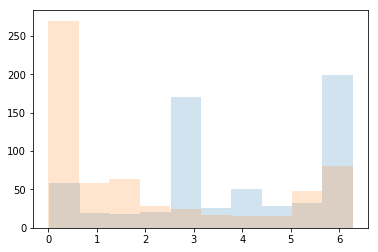

In [711]:
plt.hist(np.mod(phaseframe1[1]-phaseframe1[3],np.pi*2),bins=10,alpha=.2)
plt.hist(np.mod(phaseframe1[1]+phaseframe1[3],np.pi*2),bins=10,alpha=.2)

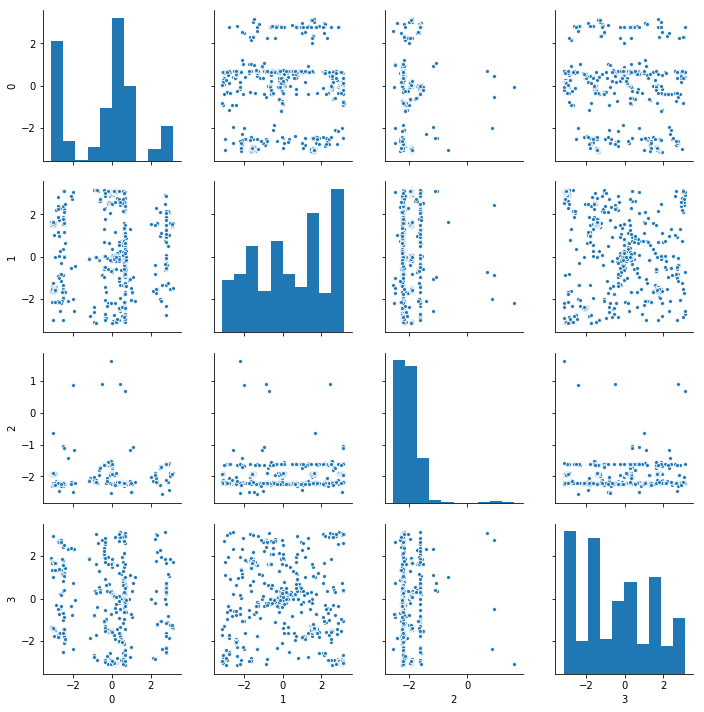

In [712]:
sns.pairplot(phaseframe1,plot_kws=dict(s=15))
#sns.pairplot(phaseframe2,plot_kws=dict(s=15))

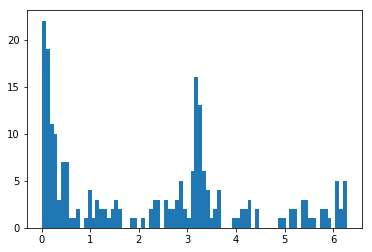

In [715]:
plt.hist(np.mod(phaseframe[1]-phaseframe[3],np.pi*2),bins=80)
plt.show()

In [179]:
aa = (np.mod(phaseframe[1]-phaseframe[3],np.pi*2)<1.6) & (np.mod(phaseframe[1]-phaseframe[3],np.pi*2)>1)
bb = (np.mod(phaseframe[1]-phaseframe[3],np.pi*2)>4.2) & (np.mod(phaseframe[1]-phaseframe[3],np.pi*2)<4.7)
qq = [aa|bb]
cc = phaseframe[aa | bb]

In [196]:
tmp = [cyclic_peptide[i] for i in cc.index]

In [197]:
wrt = Chem.SDWriter("check_1.sdf")
for mol in tmp:
    wrt.write(mol)
wrt.close()

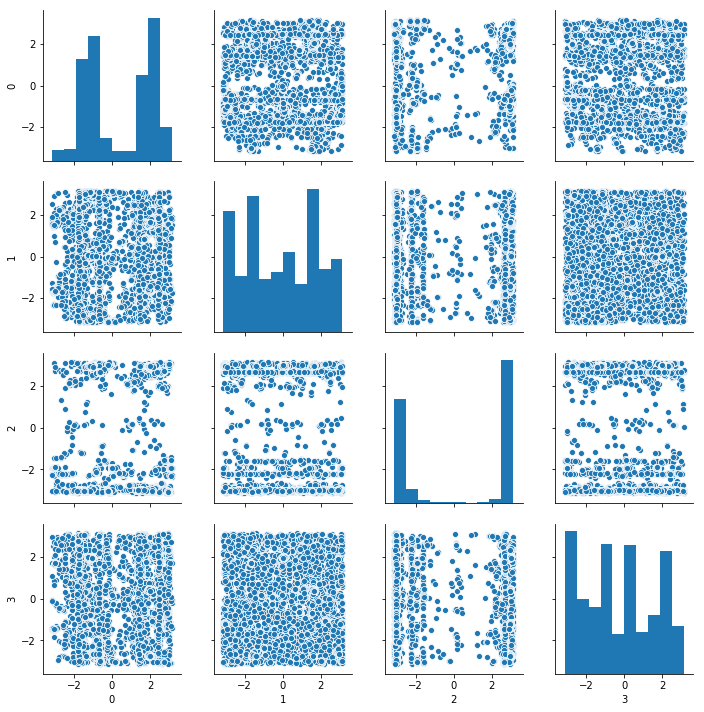

In [145]:
sns.pairplot(phaseframe)

In [87]:
amplitude = []
phase = []
for mol in cyclic_peptide:
    mol_edges = []
    for bond in mol.GetBonds():
        mol_edges.append((bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()))
    data = py_rdl.Calculator.get_calculated_result(mol_edges)
    for urf in data.urfs:
        rcs = data.get_relevant_cycles_for_urf(urf)
        for rc in rcs:
            ringatoms = RING.Rearrangement(mol,list(rc.nodes), order="default")
            rcsize = len(ringatoms)
        if rcsize==12:    
            coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in ringatoms]
            trans_coords = RING.Translate(np.array(coords)) # center the ring at origin
            amp, ang = RING.GetRingPuckerCoords(trans_coords)
    amplitude.append(amp)
    phase.append(ang)

In [111]:
data = pd.DataFrame(phase)
data1 = pd.DataFrame(amplitude)
ss = data.apply(np.sin)
cc = data.apply(np.cos)

In [112]:
join = pd.DataFrame([data1[0]*cc[0],data1[0]*ss[0],data1[1]*cc[1],data1[1]*ss[1],data1[2]*cc[2],data1[2]*ss[2],
                     data1[3]*cc[3],data1[3]*ss[3],data1[4]]).T

In [114]:
from sklearn.decomposition import PCA
pca = PCA(n_components=9)
a =pd.DataFrame(pca.fit_transform(join))

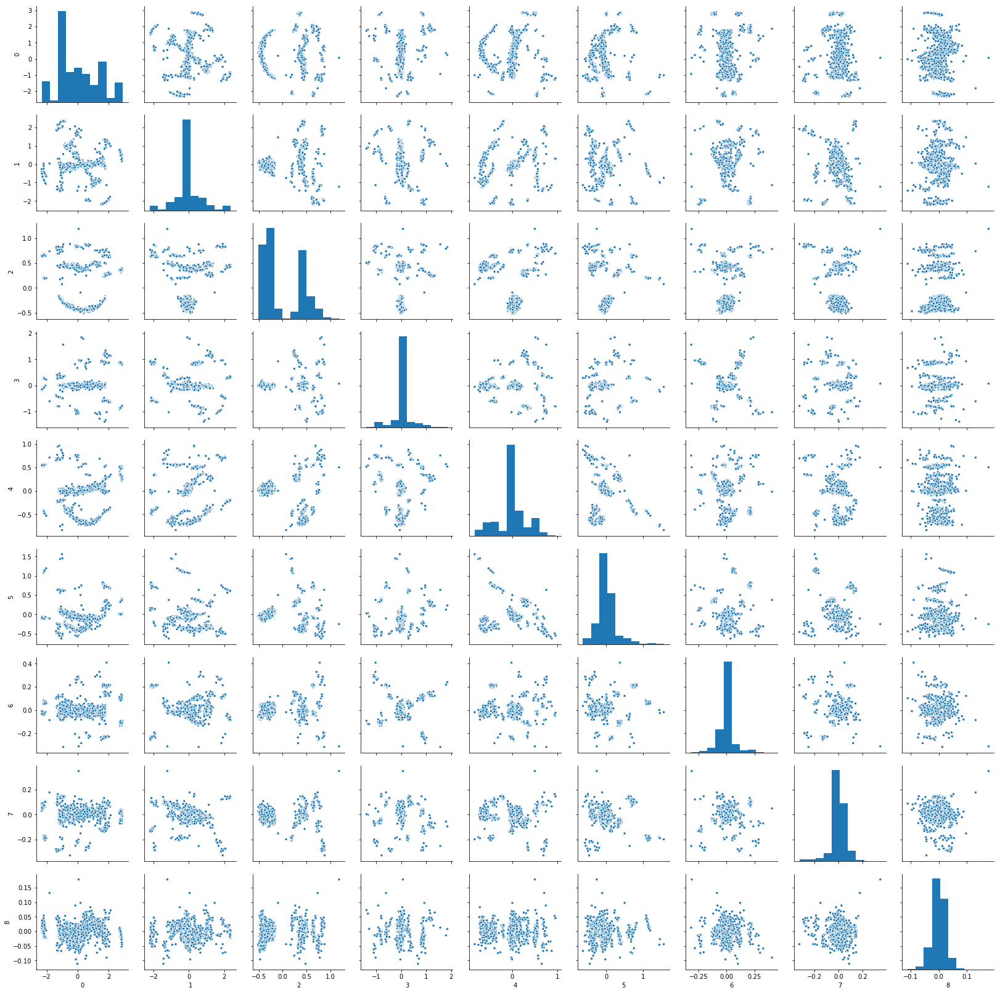

In [56]:
from itertools import product
amino_acid_list = ["H","K","D","E","G","C","S","T","A","V","F","W","L","Y"]
peptideset = list(product(amino_acid_list,repeat=2))
sep = ''
peptidelist = [sep.join(item) for item in peptideset]
peptide = [Chem.MolFromSequence(item) for item in peptidelist]


In [93]:
HD = Chem.MolFromSequence("HD")
HE = Chem.MolFromSequence("HE")
KD = Chem.MolFromSequence("KD")
KE = Chem.MolFromSequence("KE")
FH = Chem.MolFromSequence("FH")
Chem.MolToSmiles(FH)

'N[C@@H](Cc1ccccc1)C(=O)N[C@@H](Cc1c[nH]cn1)C(=O)O'

In [98]:
HD1 = Chem.MolFromSmiles("NC(Cc1c[nH]cn1)C(=O)NC(CC(=O)O)C(=O)")
HE1 = Chem.MolFromSmiles("NC(Cc1c[nH]cn1)C(=O)NC(CCC(=O)O)C(=O)")
KD1 = Chem.MolFromSmiles("NCCCCC(N)C(=O)NC(CC(=O)O)C(=O)")
KE1 = Chem.MolFromSmiles("NCCCCC(N)C(=O)NC(CCC(=O)O)C(=O)")
FH1 = Chem.MolFromSmiles("NC(Cc1ccccc1)C(=O)NC(Cc1c[nH]cn1)C(=O)")

In [ ]:
keep = []
for index, mol in enumerate(cyclic_peptide):
    if any(mol.GetSubstructMatches(histidine)) or any(mol.GetSubstructMatches(phenylalanine)) or any(mol.GetSubstructMatches(tryptophan)) or any(mol.GetSubstructMatches(tyrosin)):
        continue
    else:
        keep.append(index)

In [105]:
keep = []
for index, mol in enumerate(cyclic_peptide):
    if any(mol.GetSubstructMatches(serine)):
        keep.append(index)

In [112]:
keepmol = []
for i in val:
    keepmol.append(molecule[i])

In [114]:
sdfwriter = Chem.SDWriter("checkss.sdf")
for mol in keepmol:
    sdfwriter.write(mol)
sdfwriter.close()

In [ ]:
intra_rxn = AllChem.ReactionFromSmarts('([C:1][C:2](=[O:6])[O:3].[NH2:4][C:5])>>[C:1][C:2](=[O:6])[N:4][C:5]')

In [130]:
val = data[(data["p4"]>-0.75) | (data["p4"]<-2)].index

In [134]:
tmp = data.iloc[val,:]

In [146]:
p2 = data["p2"]
p3 = data["p3"]
p4 = data["p4"]
p5 = data["p5"]

(array([ 45.,  18.,  25.,  78.,  31.,  28.,  32.,  16.,  25.,  21., 100.,
        111., 167., 124., 143., 230., 168., 320., 709., 278., 103., 102.,
        157., 173., 602., 311., 212., 146., 192., 138., 664., 351., 308.,
        163., 219., 136., 660., 364., 297.,  64.,  45.,  52.,  47.,  46.,
         41.,  58.,  63.,  54., 106., 456.]),
 array([-6.26397094, -6.01311271, -5.76225448, -5.51139626, -5.26053803,
        -5.0096798 , -4.75882157, -4.50796335, -4.25710512, -4.00624689,
        -3.75538866, -3.50453044, -3.25367221, -3.00281398, -2.75195575,
        -2.50109753, -2.2502393 , -1.99938107, -1.74852284, -1.49766462,
        -1.24680639, -0.99594816, -0.74508993, -0.49423171, -0.24337348,
         0.00748475,  0.25834298,  0.5092012 ,  0.76005943,  1.01091766,
         1.26177589,  1.51263411,  1.76349234,  2.01435057,  2.2652088 ,
         2.51606702,  2.76692525,  3.01778348,  3.26864171,  3.51949993,
         3.77035816,  4.02121639,  4.27207462,  4.52293284,  4.77379107,
 

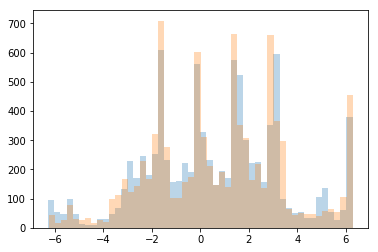

In [162]:
#plt.hist(np.mod(p3+p5,np.pi*2),bins=50,alpha=.2)
#plt.hist(np.mod(p3-p5,np.pi*2),bins=50,alpha=.2)
#plt.hist(np.mod(p3-p4,np.pi*2),bins=50,alpha=.3)
#plt.hist(np.mod(p3+p4,np.pi*2),bins=50,alpha=.3)
plt.hist(p2+p3,bins=50,alpha=.3)
plt.hist(p2-p3,bins=50,alpha=.3)

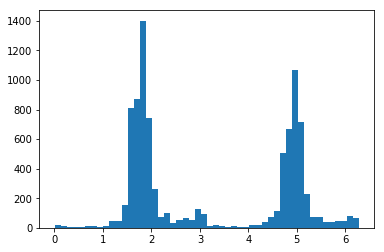

In [184]:
plt.hist(np.mod(p2+p4,np.pi*2),bins=50)
plt.show()

In [185]:
tmp = data[(np.mod(p2+p4,np.pi*2)<2) ]

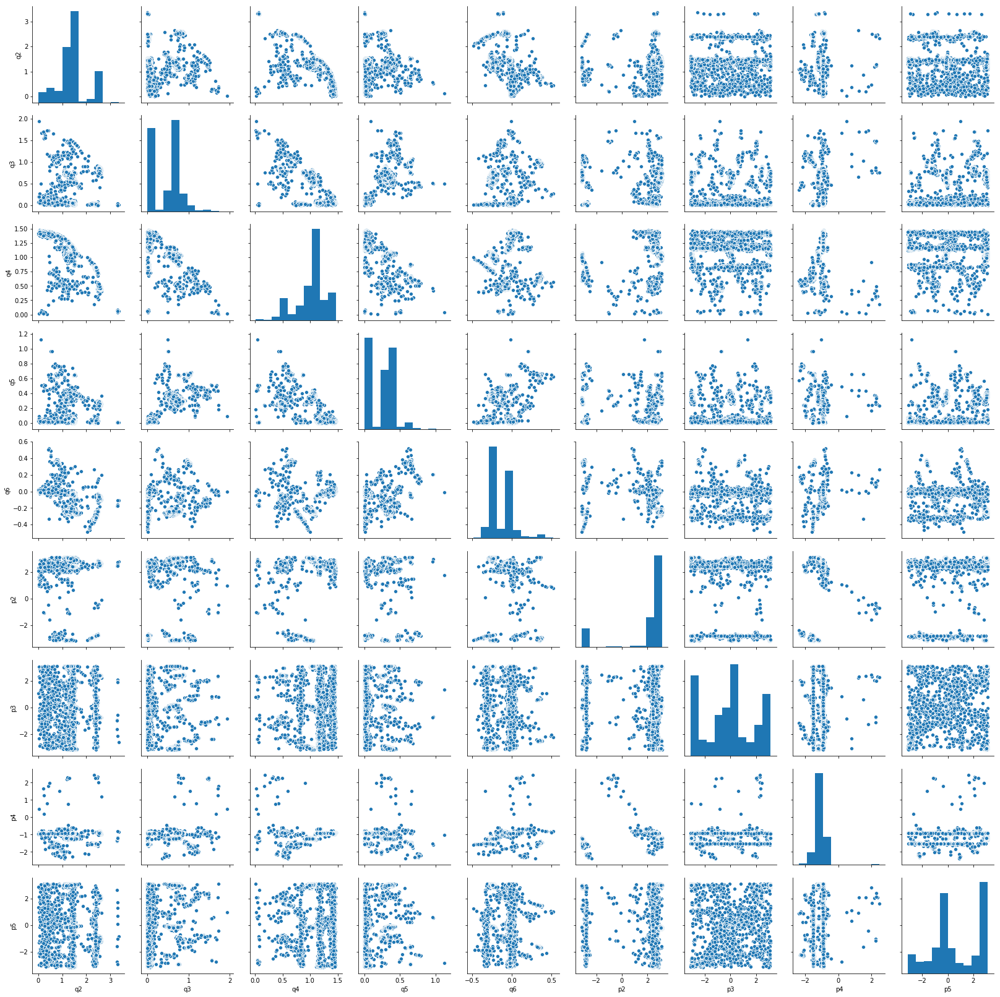

In [186]:
sns.pairplot(tmp)

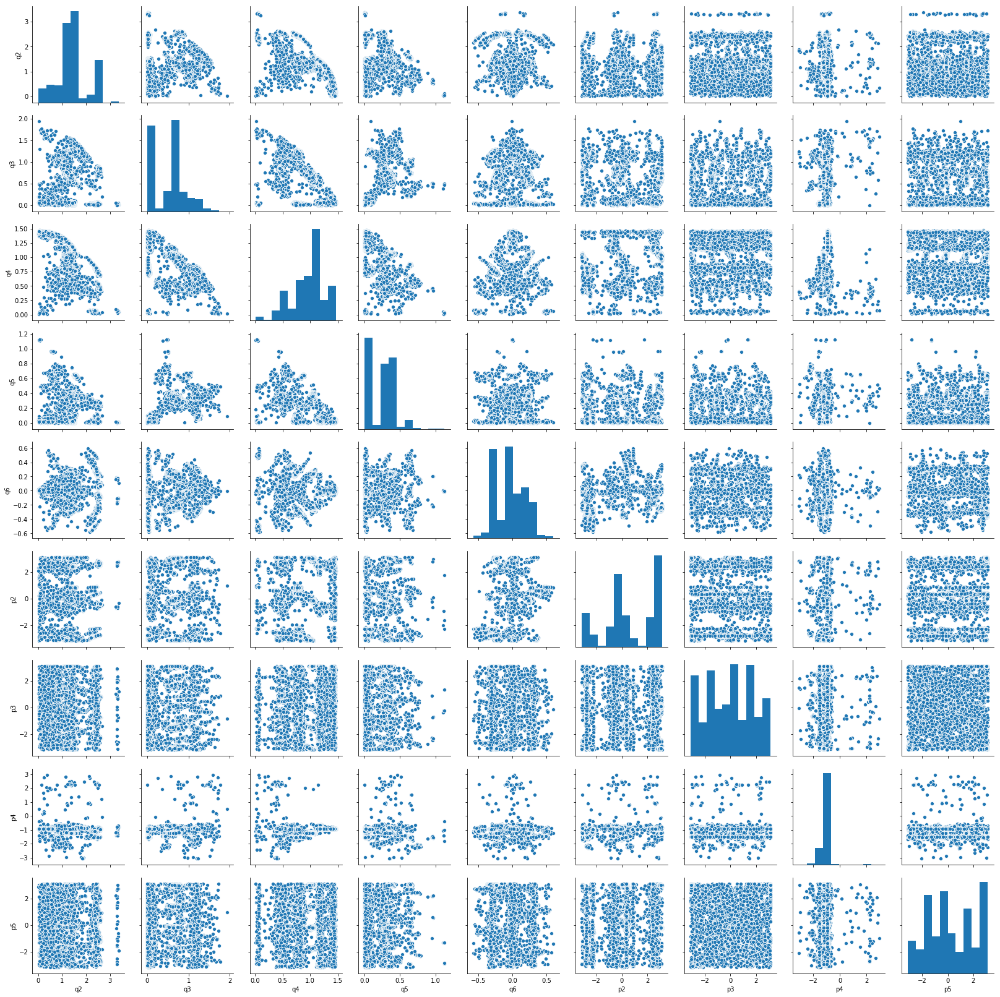

In [133]:
sns.pairplot(data)

In [19]:
old = pd.read_csv("peptide_CP.txt")
data = pd.read_csv("pep/peptide_CP.txt")

In [138]:
amplitude= []
angle = []
amide = Chem.MolFromSmarts("[C](=O)@;-[NH]")
sidechain = Chem.MolFromSmarts("[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([*])[CX3](=[OX1])[OX2H,OX1-,N]")
sub = []
side = []
molidx = []
for index, mol in enumerate(molecule):
    matches = list(mol.GetSubstructMatches(amide))
    sidematches = list(mol.GetSubstructMatches(sidechain))
    sidebond = [[x[1],x[2]] for x in sidematches]
    amidebond = [sorted([x[0],x[2]]) for x in matches]
    mol_edges = []
    for bond in mol.GetBonds():
        mol_edges.append((bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()))
    data = py_rdl.Calculator.get_calculated_result(mol_edges)
    for urf in data.urfs:
        rcs = data.get_relevant_cycles_for_urf(urf)
        for rc in rcs:
            rcsize = len(list(rc.nodes))
            ringlist = RING2.Rearrangement(mol,list(rc.nodes), order="BCE")
            if rcsize==12:
                rbond = [sorted([ringlist[i], ringlist[i+1]]) for i in range(11)] + [sorted([ringlist[-1], ringlist[0]])]
                for b in rbond:
                    if b in amidebond:
                        location = amidebond.index(b)
                        ringsubpair = matches[location][:2]
                        sub.append(RING2.GetRingSubstituentPosition(mol, ringlist, ringsubpair))
                tmp = []
                for b in sidebond:
                    tmp.append(RING2.GetRingSubstituentPosition(mol, ringlist, b))
                side.append(tmp)
                molidx.append(index)
                coords = [list(mol.GetConformer().GetAtomPosition(node)) for node in ringlist]
                ringc = RING2.Translate(np.array(coords)) # center the ring at origin
                amp, ang = RING2.GetRingPuckerCoords(ringc)
                amplitude.append(amp)
                angle.append(ang)
                

In [162]:
alpha = []
for item in side:
    if len(item)==4:
        alpha.append(item)

In [173]:
alphafull = pd.DataFrame(np.array([item[0] for x in alpha for item in x]).reshape(6544,4))
betafull = pd.DataFrame(np.array([item[1] for x in alpha for item in x]).reshape(6544,4))
joint = pd.concat([alphafull,betafull],axis=1)

In [176]:
joint.columns=[list(range(8))]

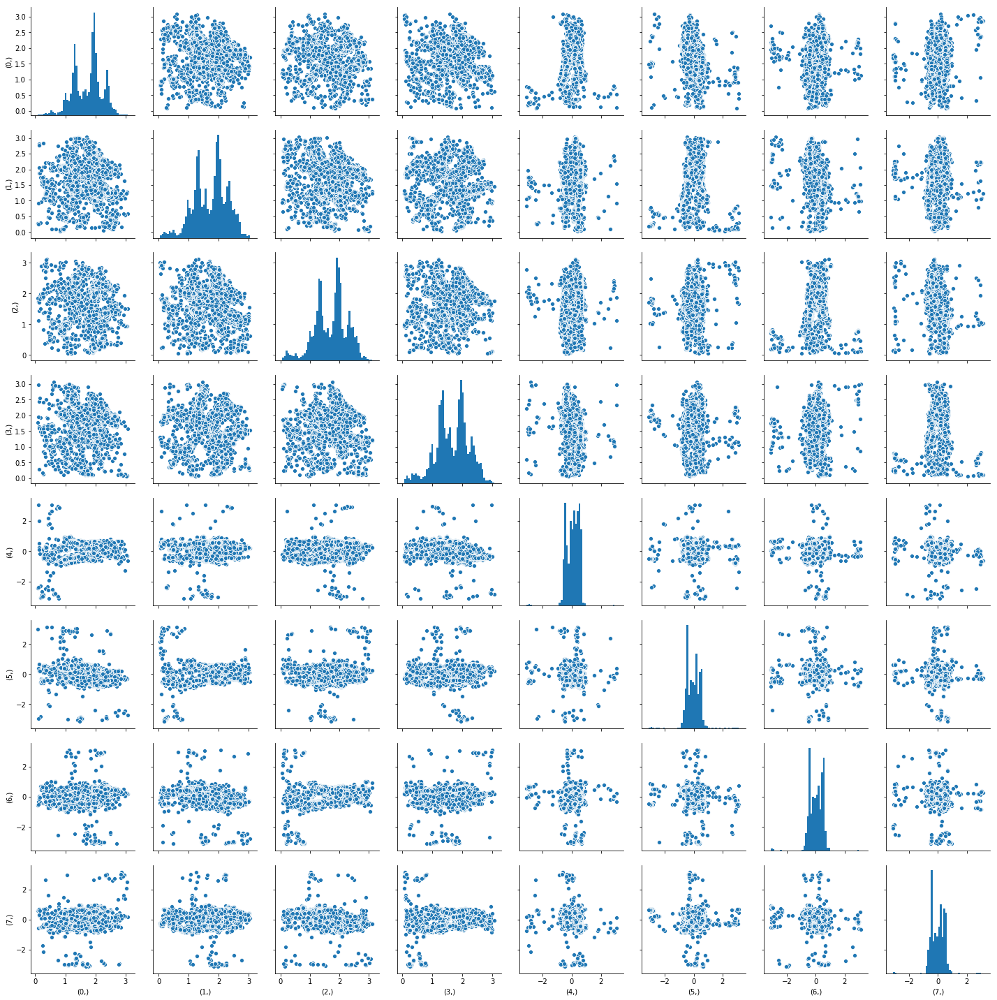

In [177]:
sns.pairplot(joint,diag_kws=dict(bins=50))

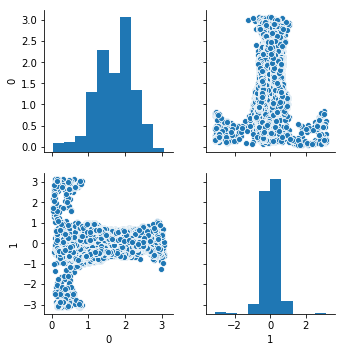

In [133]:
sns.pairplot(pd.DataFrame(side))

In [77]:
subframe = pd.DataFrame(sub, columns=["a","b"])

(array([  40.,   39.,  246.,  256.,  219.,  708., 1625., 3192., 2902.,
        2562., 2358., 1776., 1049.,  924.,  824.,  859., 1268., 1517.,
        1432.,  904.,  969.,  870.,  461.,  242.,  355.,  224.,   45.,
          25.,   25.,   71.,   46.,   43.,   49.,   37.,   46.,   58.,
         115.,  100.,  132.,  291.,  544., 1537.,  530.,  426.,  870.,
        2257.,  716.,  132.,   61.,   19.]),
 array([0.02742055, 0.08958037, 0.15174019, 0.21390002, 0.27605984,
        0.33821966, 0.40037948, 0.4625393 , 0.52469913, 0.58685895,
        0.64901877, 0.71117859, 0.77333842, 0.83549824, 0.89765806,
        0.95981788, 1.02197771, 1.08413753, 1.14629735, 1.20845717,
        1.270617  , 1.33277682, 1.39493664, 1.45709646, 1.51925629,
        1.58141611, 1.64357593, 1.70573575, 1.76789557, 1.8300554 ,
        1.89221522, 1.95437504, 2.01653486, 2.07869469, 2.14085451,
        2.20301433, 2.26517415, 2.32733398, 2.3894938 , 2.45165362,
        2.51381344, 2.57597327, 2.63813309, 2.70029291, 

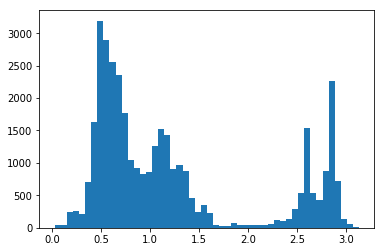

In [79]:
plt.hist(subframe["a"],bins=50)

In [38]:
mol = molecule[0]
mol.GetSubstructMatches(amide)

((1, 0, 2), (10, 11, 12), (14, 15, 16), (18, 19, 20))

In [100]:
alphaframe = pd.DataFrame(subframe["a"].values.reshape([8999,4]))
betaframe = pd.DataFrame(subframe["b"].values.reshape([8999,4]))

In [126]:
angleframe = pd.DataFrame(angle)
ampframe = pd.DataFrame(amplitude)

In [127]:
ee = pd.concat([ampframe,angleframe,alphaframe],axis=1)
ee.columns=["a","b","c","d","e","f","g","h","i","j","k","l","m"]

In [128]:
#qq = ee[(ee["a"]<-1.5) | (ee["a"]>1.5)]

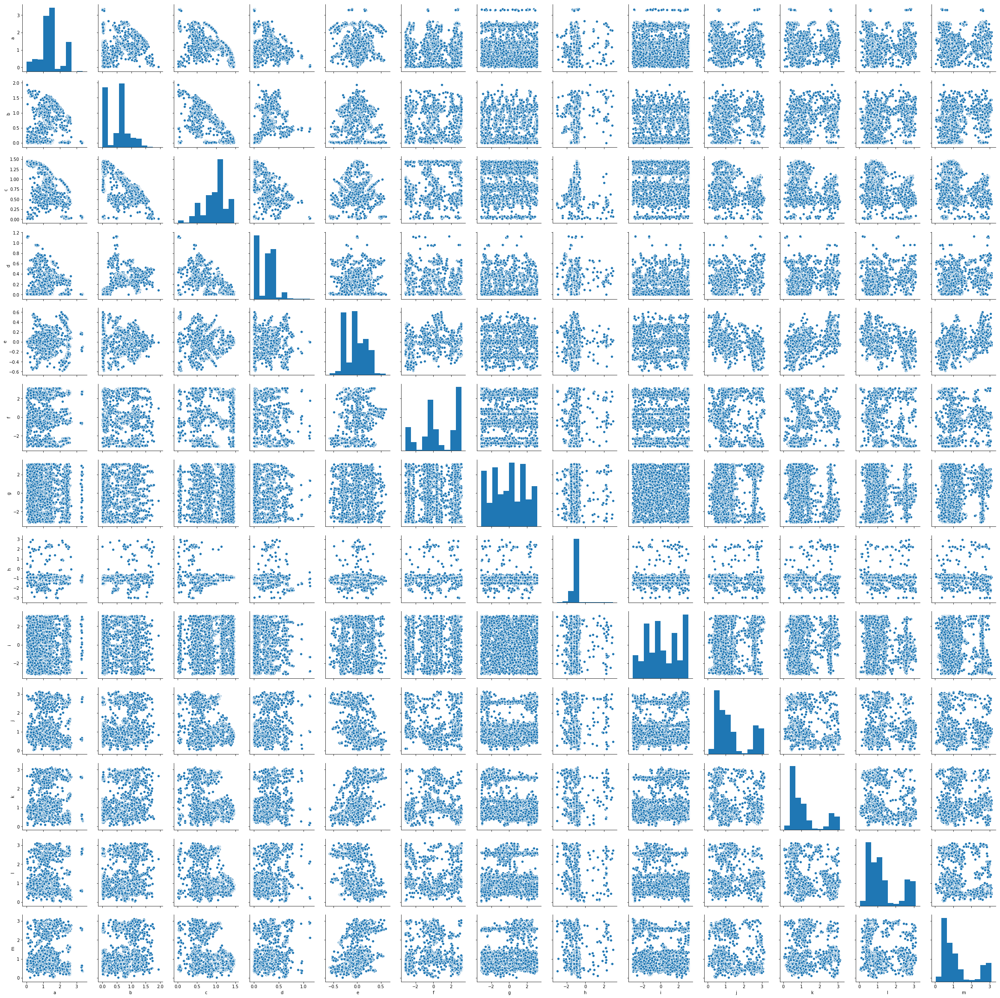

In [129]:
sns.pairplot(ee)

In [41]:
r12 = Chem.MolFromSmarts("[r12]")

In [64]:
a = (1,2,3)

In [65]:
a[:2]

(1, 2)

In [63]:
RING2.GetRingSubstituentPosition(mol,[1,2,3,10,12,14,16,17,18,20,21],(1,0))

(2.380816072320981, 0.6506773500330045)

In [57]:
a = np.array([[-1.978, 0.5369, 0.6633], [-3.0099, 0.2289, 1.231]])

In [58]:
a-np.array([1,1,1])

array([[-2.978 , -0.4631, -0.3367],
       [-4.0099, -0.7711,  0.231 ]])

In [60]:
a = [[2,2,2],[3,3,3]]

In [62]:
np.diff(a,axis=0)

array([[1, 1, 1]])